# Organise dataset for interface

In [1]:
import os
import shutil
from collections import defaultdict

# Define the required angles
required_angles = {'LF', 'RF', 'LB', 'AH', 'AS'}

# Path to the folder containing images
image_folder = 'images'
output_folder = 'organised_samples'

# Collect images by id and angle
images_by_id = defaultdict(dict)
for filename in os.listdir(image_folder):
    if filename.endswith('.jpg'):
        parts = filename.split('-')
        if len(parts) >= 4:
            img_id = parts[1]
            angle = parts[3]
            angle = angle.split('.')[0]  # Remove .jpg
            images_by_id[img_id][angle] = filename

# Filter ids with all required angles
valid_ids = [img_id for img_id, angles in images_by_id.items() if required_angles.issubset(angles.keys())]

# Take 10 samples
sample_ids = valid_ids[:10]

# Organise images into folders
os.makedirs(output_folder, exist_ok=True)
for img_id in sample_ids:
    id_folder = os.path.join(output_folder, img_id)
    os.makedirs(id_folder, exist_ok=True)
    for angle in required_angles:
        src = os.path.join(image_folder, images_by_id[img_id][angle])
        dst = os.path.join(id_folder, images_by_id[img_id][angle])
        shutil.copy(src, dst)

In [13]:
import os
import shutil
import random
from PIL import Image

# Paths
images_dir = 'images'
labels_dir = 'images_label'
output_dir = './yolo_dataset'
os.makedirs(f'{output_dir}/images/train', exist_ok=True)
os.makedirs(f'{output_dir}/images/val', exist_ok=True)
os.makedirs(f'{output_dir}/labels/train', exist_ok=True)
os.makedirs(f'{output_dir}/labels/val', exist_ok=True)

# Helper to check if text is ISO code
def is_iso_code(text):
    # Condition lenght is 4
    if len(text) != 4:
        return False
    # Check if it starts with two digits and end with a letter then a digit
    #if not (text[0:2].isdigit() and text[2:4].isalpha() and text[3].isdigit()):
    #    return False
    
    return True  # adjust rules if needed

# Helper to check if text is owner code
def is_owner_code(text):
    # Condition length is 4
    if len(text) != 11:
        return False
    # Check if it starts with 4 letter and ends with 7 digit
    if not (text[0:4].isalpha() and text[4:11].isdigit()):
        return False
    
    return True  # adjust rules if needed

# Get all valid files
all_files = []
for filename in os.listdir(labels_dir):
    label_path = os.path.join(labels_dir, filename)
    with open(label_path, 'r') as f:
        lines = f.readlines()
    if 1 <= len(lines) <= 2:
        all_files.append(filename.replace('.txt', ''))

# Shuffle and split
random.shuffle(all_files)
split_idx = int(0.8 * len(all_files))
train_files = all_files[:split_idx]
val_files = all_files[split_idx:]

# Function to convert and copy files
def process_files(file_list, split):
    for file_id in file_list:
        image_path = os.path.join(images_dir, file_id + '.jpg')
        label_path = os.path.join(labels_dir, file_id + '.txt')

        # Load image size
        img = Image.open(image_path)
        img_w, img_h = img.size

        # Output label path
        yolo_label_lines = []
        with open(label_path, 'r') as f:
            for line in f:
                parts = line.strip().split(',')
                if len(parts) != 5:
                    continue
                x_min, y_min, x_max, y_max, text = parts
                x_min, y_min, x_max, y_max = map(int, [x_min, y_min, x_max, y_max])
                x_center = (x_min + x_max) / 2 / img_w
                y_center = (y_min + y_max) / 2 / img_h
                width = (x_max - x_min) / img_w
                height = (y_max - y_min) / img_h

                # Determine class
                if is_owner_code(text):
                    class_id = 0
                elif is_iso_code(text):
                    class_id = 1
                else:
                    continue
                yolo_line = f"{class_id} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}"
                yolo_label_lines.append(yolo_line)

        # Save converted label
        with open(f"{output_dir}/labels/{split}/{file_id}.txt", 'w') as f:
            f.write('\n'.join(yolo_label_lines))

        # Copy image
        shutil.copy(image_path, f"{output_dir}/images/{split}/{file_id}.jpg")

# Process all
process_files(train_files, 'train')
process_files(val_files, 'val')


In [34]:
# Save separatly the non processed files
non_processed_files = set([name.replace(".jpg","") for name in os.listdir(images_dir)]) - set(train_files + val_files)

#  Copy non-processed images to a separate folder
non_processed_dir = os.path.join(output_dir, 'images', 'non_processed')
os.makedirs(non_processed_dir, exist_ok=True)
for file_id in non_processed_files:
    print(f"Copying non-processed image: {file_id}")
    src_image_path = os.path.join(images_dir, file_id + ".jpg")
    if os.path.exists(src_image_path):
        shutil.copy(src_image_path, non_processed_dir)

Copying non-processed image: 1-141332001-OCR-LF-C01
Copying non-processed image: 1-124544001-OCR-LB-C02
Copying non-processed image: 1-155800001-OCR-LF-C01
Copying non-processed image: 1-145552001-OCR-RF-D01
Copying non-processed image: 1-141210001-OCR-RF-D01
Copying non-processed image: 1-145322001-OCR-RF-D01
Copying non-processed image: 1-123809001-OCR-RF-D01
Copying non-processed image: 1-132924001-OCR-LF-C01
Copying non-processed image: 1-142900001-OCR-RF-D01
Copying non-processed image: 1-131526001-OCR-LF-C01
Copying non-processed image: 1-141723001-OCR-RF-D01
Copying non-processed image: 1-155800001-OCR-RF-D01
Copying non-processed image: 1-130159001-OCR-AS-B01
Copying non-processed image: 1-123822001-OCR-RF-D01
Copying non-processed image: 1-143546001-OCR-RF-D01
Copying non-processed image: 1-130417001-OCR-RF-D01
Copying non-processed image: 1-124544001-OCR-RF-D01
Copying non-processed image: 1-152119001-OCR-LF-C01
Copying non-processed image: 1-145251001-OCR-RF-D01
Copying non-

In [31]:
print(len(train_files), len(val_files))
print(f"Processed {len(train_files)} training files and {len(val_files)} validation files.")
print(len(os.listdir(images_dir)))
print(len(non_processed_files))
print(len(train_files))

2219 555
Processed 2219 training files and 555 validation files.
3003
229
2219


In [10]:
import os
import cv2
import matplotlib.pyplot as plt

image_dir = "organised_samples"
labeled_image_dir = "labeled_samples"
label_dir = "images_label"
# Create labeled image directory
os.makedirs(labeled_image_dir, exist_ok=True)

# Process each image and its corresponding label
for img_id in os.listdir(image_dir):
    for image in os.listdir(os.path.join(image_dir, img_id)):
        image_path = os.path.join(image_dir, img_id, image)
        # remove the .jpg extension from the image name to match the label file
        image_no_ext = os.path.splitext(image)[0]
        label_path = os.path.join(label_dir, image_no_ext + '.txt')
        print(f"Processing {image_path} with label {label_path}")
        
        if os.path.exists(label_path):

            # Create the labeled image
            labeled_image = cv2.imread(image_path)
            with open(label_path, 'r') as f:
                lines = f.readlines()
                label_text = ""
                for line in lines:
                    parts = line.strip().split(',')
                    if len(parts) != 5:
                        continue
                    x_min, y_min, x_max, y_max, text = parts
                    x_min, y_min, x_max, y_max = map(int, [x_min, y_min, x_max, y_max])
                    
                    # Draw rectangle and label on the image
                    cv2.rectangle(labeled_image, (x_min, y_min), (x_max, y_max), (255, 255, 0), 2)
                    cv2.putText(labeled_image, text, (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.75, (255, 255, 0), 2)
                    
                    # Store the label and the bounding box in text file
                    if len(text) == 11:
                        class_id = 0
                    elif len(text) == 4:
                        class_id = 1
                    else:
                        class_id = -1
                    label_text += f"{class_id} {text} {x_min} {y_min} {x_max} {y_max}\n"

            # Create a directory of img_id if it doesn't exist
            os.makedirs(os.path.join(labeled_image_dir, img_id), exist_ok=True)
            # Save the label text file
            label_file_path = os.path.join(labeled_image_dir, img_id, f"{image_no_ext}.txt")
            with open(label_file_path, 'w') as label_file:
                label_file.write(label_text.strip())

            # Ensure the output filename has a valid image extension (e.g., .jpg)
            labeled_image_save_path = os.path.join(labeled_image_dir, img_id, f"{image_no_ext}.jpg")
            cv2.imwrite(labeled_image_save_path, labeled_image)
# Display a message indicating completion
print("Labeled images have been saved to:", labeled_image_dir)

Processing organised_samples\124126001\1-124126001-OCR-AH-A01.jpg with label images_label\1-124126001-OCR-AH-A01.txt
Processing organised_samples\124126001\1-124126001-OCR-AS-B01.jpg with label images_label\1-124126001-OCR-AS-B01.txt
Processing organised_samples\124126001\1-124126001-OCR-LB-C02.jpg with label images_label\1-124126001-OCR-LB-C02.txt
Processing organised_samples\124126001\1-124126001-OCR-LF-C01.jpg with label images_label\1-124126001-OCR-LF-C01.txt
Processing organised_samples\124126001\1-124126001-OCR-RF-D01.jpg with label images_label\1-124126001-OCR-RF-D01.txt
Processing organised_samples\124835001\1-124835001-OCR-AH-A01.jpg with label images_label\1-124835001-OCR-AH-A01.txt
Processing organised_samples\124835001\1-124835001-OCR-AS-B01.jpg with label images_label\1-124835001-OCR-AS-B01.txt
Processing organised_samples\124835001\1-124835001-OCR-LB-C02.jpg with label images_label\1-124835001-OCR-LB-C02.txt
Processing organised_samples\124835001\1-124835001-OCR-LF-C01.jp

# 

In [33]:
def text_to_class_id(text):
    if len(text) == 11 and text[0:4].isalpha() and text[4:11].isdigit():
        return 0
    elif len(text) == 4 and text.isalpha():
        return 1
    else:
        return -1


# Crop images based on labels
cropped_images_dir = "cropped_images"
image_dir = "images"
label_dir = "images_label"
os.makedirs(cropped_images_dir, exist_ok=True)
# Process each labeled image and crop based on the labels
for img_id in os.listdir(image_dir):
    image_path = os.path.join(image_dir, img_id)
    # Only process image files
    if not img_id.lower().endswith(('.jpg', '.jpeg', '.png')):
        continue
    label_path = os.path.join(label_dir, os.path.splitext(img_id)[0] + '.txt')
    
    if os.path.exists(label_path):
        img = cv2.imread(image_path)
        if img is None:
            print(f"Warning: Could not read image {image_path}")
            continue
        with open(label_path, 'r') as f:
            lines = f.readlines()
            for line in lines:
                parts = line.strip().split(',')
                if len(parts) < 5:
                    print(parts,len(parts))
                    continue
                class_id = text_to_class_id(parts[-1])
                x_min = int(parts[0])
                y_min = int(parts[1])
                x_max = int(parts[2])
                y_max = int(parts[3])
                
                cropped_img = img[y_min:y_max, x_min:x_max]                    
                cropped_image_name = f"{img_id}_{class_id}.jpg"
                cropped_image_path = os.path.join(cropped_images_dir, cropped_image_name)
                print(f"Cropping {image_path} to {cropped_image_path} with coordinates ({x_min}, {y_min}, {x_max}, {y_max})")
                cv2.imwrite(cropped_image_path, cropped_img)

Cropping images\1-122700001-OCR-LF-C01.jpg to cropped_images\1-122700001-OCR-LF-C01.jpg_0.jpg with coordinates (1222, 202, 1321, 883)
Cropping images\1-122700001-OCR-LF-C01.jpg to cropped_images\1-122700001-OCR-LF-C01.jpg_-1.jpg with coordinates (1416, 212, 1469, 459)
Cropping images\1-122720001-OCR-AH-A01.jpg to cropped_images\1-122720001-OCR-AH-A01.jpg_0.jpg with coordinates (194, 204, 937, 325)
Cropping images\1-122720001-OCR-AS-B01.jpg to cropped_images\1-122720001-OCR-AS-B01.jpg_0.jpg with coordinates (896, 276, 1403, 377)
Cropping images\1-122720001-OCR-AS-B01.jpg to cropped_images\1-122720001-OCR-AS-B01.jpg_-1.jpg with coordinates (1114, 401, 1279, 498)
Cropping images\1-122720001-OCR-LB-C02.jpg to cropped_images\1-122720001-OCR-LB-C02.jpg_0.jpg with coordinates (204, 1, 1051, 121)
Cropping images\1-122720001-OCR-LB-C02.jpg to cropped_images\1-122720001-OCR-LB-C02.jpg_-1.jpg with coordinates (488, 113, 781, 210)
Cropping images\1-122720001-OCR-RF-D01.jpg to cropped_images\1-1227

error: OpenCV(4.10.0) D:\a\opencv-python\opencv-python\opencv\modules\imgcodecs\src\loadsave.cpp:798: error: (-215:Assertion failed) !_img.empty() in function 'cv::imwrite'


In [ ]:
# Crop the images based on the labels
cropped_images_dir = "label_cropped"
image_dir = "labeled_samples"
os.makedirs(cropped_images_dir, exist_ok=True)
# Process each labeled image and crop based on the labels
for img_id in os.listdir(labeled_image_dir):
    for image in os.listdir(os.path.join(labeled_image_dir, img_id)):
        labeled_image_path = os.path.join(image_dir, image)
        # Only process image files
        if not image.lower().endswith(('.jpg', '.jpeg', '.png')):
            continue
        label_path = os.path.join(labeled_image_dir, img_id, os.path.splitext(image)[0] + '.txt')
        
        if os.path.exists(label_path):
            img = cv2.imread(labeled_image_path)
            if img is None:
                print(f"Warning: Could not read image {labeled_image_path}")
                continue
            with open(label_path, 'r') as f:
                lines = f.readlines()
                for line in lines:
                    parts = line.strip().split()
                    if len(parts) < 6:
                        continue
                    class_id = parts[0]
                    x_min = int(parts[2])
                    y_min = int(parts[3])
                    x_max = int(parts[4])
                    y_max = int(parts[5])
                    
                    cropped_img = img[y_min:y_max, x_min:x_max]                    
                    cropped_image_name = f"{img_id}_{class_id}.jpg"
                    cropped_image_path = os.path.join(cropped_images_dir, cropped_image_name)
                    cv2.imwrite(cropped_image_path, cropped_img)

In [19]:
import os
import cv2

def crop_labeled_regions(image_dir = 'images', labeled_image_dir="labeled_samples"):
    """
    For each id in labeled_samples, create subfolders for each labeled image.
    In each subfolder, save cropped regions with class_id in the filename.
    """
    for img_id in os.listdir(labeled_image_dir):
        id_folder = os.path.join(labeled_image_dir, img_id)
        if not os.path.isdir(id_folder):
            continue
        for image in os.listdir(id_folder):
            if not image.lower().endswith(('.jpg', '.jpeg', '.png')):
                continue
            image_no_ext = os.path.splitext(image)[0]
            label_path = os.path.join(id_folder, image_no_ext + '.txt')
            labeled_image_path = os.path.join(id_folder, image)
            image_path = os.path.join(image_dir, image)
            if not os.path.exists(label_path):
                continue
            img = cv2.imread(image_path)
            if img is None:
                print(f"Warning: Could not read image {image_path}")
                continue
            # Create output subfolder for this image
            out_subfolder = os.path.join(labeled_image_dir, img_id, image_no_ext)
            os.makedirs(out_subfolder, exist_ok=True)
            with open(label_path, 'r') as f:
                lines = f.readlines()
                for idx, line in enumerate(lines):
                    parts = line.strip().split()
                    if len(parts) < 6:
                        continue
                    class_id = parts[0]
                    x_min = int(parts[2])
                    y_min = int(parts[3])
                    x_max = int(parts[4])
                    y_max = int(parts[5])
                    cropped_img = img[y_min:y_max, x_min:x_max]
                    crop_name = f"{image_no_ext}_crop_{idx}_class{class_id}.jpg"
                    crop_path = os.path.join(out_subfolder, crop_name)
                    cv2.imwrite(crop_path, cropped_img)
    print(f"All crops saved in: {labeled_image_dir}")

# Example usage:
crop_labeled_regions(image_dir = 'images', labeled_image_dir="labeled_samples")

All crops saved in: labeled_samples


# Cropping function and image reconstitution

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO

def adaptive_threshold_and_filter(image_path, min_area=50, window_size=31, window_constant=-1, kernel_size=3, op_iterations=1, display = False):

    inputImage = cv2.imread(image_path)
    inputCopy = inputImage.copy()

    # Convert BGR to grayscale:
    grayscaleImage = cv2.cvtColor(inputImage, cv2.COLOR_BGR2GRAY)

    # Set the adaptive thresholding (gaussian) parameters:
    # Apply the threshold:
    binaryImage = cv2.adaptiveThreshold(
        grayscaleImage, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
        cv2.THRESH_BINARY, window_size, window_constant
    )

    # Invert if mean value is high (background is white)
    mean_val = np.mean(binaryImage)
    if mean_val > 125:
        binaryImage = cv2.bitwise_not(binaryImage)
    print(f"Mean value of the binary image: {mean_val}")


    # Perform an area filter on the binary blobs:
    componentsNumber, labeledImage, componentStats, componentCentroids = \
        cv2.connectedComponentsWithStats(binaryImage, connectivity=4)

    # Get the indices/labels of the remaining components based on the area stat
    remainingComponentLabels = [i for i in range(1, componentsNumber) if componentStats[i][4] >= min_area]

    # Filter the labeled pixels based on the remaining labels
    filteredImage = np.where(np.isin(labeledImage, remainingComponentLabels), 255, 0).astype('uint8')


    # Morphological closing:
    maxKernel = cv2.getStructuringElement(cv2.MORPH_RECT, (kernel_size, kernel_size))
    closingImage = cv2.morphologyEx(filteredImage, cv2.MORPH_CLOSE, maxKernel, None, None, op_iterations, cv2.BORDER_REFLECT101)


    # Get each bounding box
    contours, hierarchy = cv2.findContours(closingImage, cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)
    contours_poly = [None] * len(contours)
    boundRect = []

    for i, c in enumerate(contours):
        if hierarchy[0][i][3] == -1:
            contours_poly[i] = cv2.approxPolyDP(c, 3, True)
            boundRect.append(cv2.boundingRect(contours_poly[i]))

    # Load YOLO model (update the path if needed)
    model = YOLO('../runs/detect/train_alphanum_detection/weights/best.pt')

    # Run YOLO detection
    results = model(image_path)  # image_path should be defined earlier

    boundRect = []
    inputCopy = cv2.imread(image_path)
    inputCopy = cv2.cvtColor(inputCopy, cv2.COLOR_BGR2RGB)

    for result in results:
        boxes = result.boxes.xyxy.cpu().numpy()
        confs = result.boxes.conf.cpu().numpy()
        for box, conf in zip(boxes, confs):
            if conf >= 0.75:
                x1, y1, x2, y2 = map(int, box[:4])
                w = x2 - x1
                h = y2 - y1
                boundRect.append((x1, y1, w, h))
                color = (0, 255, 0)
                cv2.rectangle(inputCopy, (x1, y1), (x2, y2), color, 2)
    
    # After you get boundRect and inputImage is loaded
    
    # Convert to numpy array for easier processing
    boundRect_np = np.array(boundRect)
    if len(boundRect_np) > 0:
        widths = boundRect_np[:, 2]
        heights = boundRect_np[:, 3]

        mean_w = np.mean(widths)
        mean_h = np.mean(heights)
        std_w = np.std(widths)
        std_h = np.std(heights)

        # Keep only boxes within a threshold (e.g., 1 std) of the mean width and height
        keep = []
        for box in boundRect:
            w, h = box[2], box[3]
            if (abs(h - mean_h)/mean_h <= 0.4):
                keep.append(box)
        boundRect = keep
    
    # Sort the bounding rectangles based on their position
    h, w = inputImage.shape[:2]
    if w > h:
        # Horizontal: sort by x (left to right)
        boundRect = sorted(boundRect, key=lambda b: b[0])
    else:
        # Vertical: sort by y (top to bottom)
        boundRect = sorted(boundRect, key=lambda b: b[1])

    # Visualize the bounding boxes
    if display:
        plt.imshow(inputCopy)
        plt.title("YOLO Bounding Boxes Detected")
        plt.axis('off')
        plt.show()

    return closingImage, boundRect  # closingImage is not relevant here, so return None

def reconstitute_characters_with_padding(closingImage, boundRect, space=10, top_pad=5, bottom_pad=5, left_pad=2, right_pad=2, save_path="reconstituted_image.png"):
    """
    Crops character images from bounding rectangles, pads and concatenates them with black borders.
    Returns the final padded image.
    """
    import numpy as np
    import cv2
    import matplotlib.pyplot as plt

    
    # Condition to check if the image is vertical
    #if closingImage.shape[0] > closingImage.shape[1]:
    #print("The image is vertical, resizing to horizontal orientation.")

    # Crop character images (reverse order as in your code)
    cropped_images = []
    for i in range(len(boundRect)):
        x, y, w, h = boundRect[i]
        croppedImg = closingImage[y:y + h, x:x + w]
        cropped_images.append(croppedImg)

    # Find the maximum height among all cropped images
    max_height = max(img.shape[0] for img in cropped_images)

    # Resize all images to the same height (pad with black if needed)
    cropped_images_padded = []
    for img in cropped_images:
        h, w = img.shape
        if h < max_height:
            pad = np.zeros((max_height - h, w), dtype=img.dtype)
            img_padded = np.vstack([img, pad])
        else:
            img_padded = img
        cropped_images_padded.append(img_padded)

    # Create black space image
    black_space = np.zeros((max_height, space), dtype=np.uint8)

    # Concatenate images with black space in between
    result = cropped_images_padded[0]
    for img in cropped_images_padded[1:]:
        result = np.hstack([result, black_space, img])

    # Add black space at the top, bottom, left, and right
    result_padded = np.pad(
        result,
        pad_width=((top_pad, bottom_pad), (left_pad, right_pad)),
        mode='constant',
        constant_values=0
    )

    # Show the result
    plt.imshow(result_padded, cmap='gray')
    plt.axis('off')
    plt.title('Reconstituted Image with Black Borders and Padding')
    plt.show()

    # Save the reconstituted image with borders and padding
    cv2.imwrite(save_path, result_padded)
    print(f"Reconstituted image saved as '{save_path}'")

    return result_padded
"""   
    else:
        print("The image is horizontal")
        # Show the original closing image
        plt.imshow(closingImage, cmap='gray')
        plt.axis('off')
        plt.title('Original Closing Image')
        plt.show()
        
        # Save the original closing image
        cv2.imwrite(save_path, closingImage)
        print(f"Original closing image saved as '{save_path}'")
        return closingImage
"""

ModuleNotFoundError: No module named 'ultralytics'

# ADDED !!!!!!

In [ ]:
!pip install easyocr

In [2]:
def save_cropped_characters(cropped_images, boundRect, f_name = "test" ,output_dir="cropped_characters"):
    """
    Saves cropped character images to the specified output directory.
    """
    import os
    os.makedirs(output_dir, exist_ok=True)
    
    for i, (img, rect) in enumerate(zip(cropped_images, boundRect)):
        x, y, w, h = rect
        save_path = os.path.join(output_dir, f"char_{i}_{f_name}.png")
        cv2.imwrite(save_path, img)
        
def save_all_cropped_characters(input_dir="images", output_dir="cropped_characters"):
    """
    Saves all cropped character images from the input directory of origine images to the output directory.
    """
    import os
    import cv2
    
    os.makedirs(output_dir, exist_ok=True)
    
    for image in os.listdir(input_dir):
        image_path = os.path.join(input_dir, image)
        closingImage, boundRect = adaptive_threshold_and_filter(image_path)
        cropped_images = []
        for rect in boundRect:
            x, y, w, h = rect
            croppedImg = closingImage[y:y + h, x:x + w]
            cropped_images.append(croppedImg)
            
        save_cropped_characters(cropped_images, boundRect, f_name=image.split('.')[0], output_dir=output_dir)

In [3]:

def save_all_cropped_characters_labeled(input_dir="images", output_dir="cropped_characters"):
    """
    Saves all cropped character images from the input directory of origine images to the output directory.
    """
    import os
    import cv2
    import easyocr

    reader = easyocr.Reader(['en'])
    
    os.makedirs(output_dir, exist_ok=True)
    
    for image in os.listdir(input_dir):
        image_path = os.path.join(input_dir, image)
        closingImage, boundRect = adaptive_threshold_and_filter(image_path)
        cropped_images = []
        for rect in boundRect:
            x, y, w, h = rect
            croppedImg = closingImage[y:y + h, x:x + w]
            label = ""
            result = reader.readtext(croppedImg, detail=1, paragraph=False)
            
            if result and len(result[0]) == 1 and result[0].isalnum():
                label = result[0]
            else:
                label = ""

            # Show the image and print the detected label
            print(f"Image: {image}")
            plt.imshow(croppedImg)

            print(f"Detected label: '{label}'")
            user_input = input("Press Enter to accept, or type the correct label: ").strip()
            if user_input:
                label = user_input

            if label:
                new_name = f"{label}_labeled_{image}"
                cv2.imwrite(os.path.join(output_dir, new_name), image)
                print(f"Saved as: {new_name}")
            else:
                print("No label assigned, image skipped.")

In [4]:
save_all_cropped_characters_labeled(input_dir="cropped_images", output_dir="cropped_characters")

ModuleNotFoundError: No module named 'easyocr'

# ADDED !!!! SEMI SUPERVISED MODEL

In [ ]:
import easyocr
import cv2
import os

reader = easyocr.Reader(['en'])
input_folder = 'cropped_characters/'
output_folder = 'labeled_chars/'
os.makedirs(output_folder, exist_ok=True)

for fname in os.listdir(input_folder):
    img_path = os.path.join(input_folder, fname)
    img = cv2.imread(img_path)
    result = reader.readtext(img, detail=0)

    label = ""
    if result and len(result[0]) == 1 and result[0].isalnum():
        label = result[0]
    else:
        label = ""

    # Show the image and print the detected label
    print(f"Image: {fname}")
    if img is not None:
        plt.imshow(img)

    print(f"Detected label: '{label}'")
    user_input = input("Press Enter to accept, or type the correct label: ").strip()
    if user_input:
        label = user_input

    if label:
        new_name = f"{label}_labeled_{fname}"
        cv2.imwrite(os.path.join(output_folder, new_name), img)
        print(f"Saved as: {new_name}")
    else:
        print("No label assigned, image skipped.")

In [5]:
import os
import cv2
import random
import numpy as np
from collections import Counter
from tqdm import tqdm

from albumentations import (
    Compose, RandomBrightnessContrast, Rotate, Blur, GaussNoise, ShiftScaleRotate, HorizontalFlip, VerticalFlip
)

# Directory with your cropped character images (filenames start with label, e.g., "A_labeled_...")
input_dir = "cropped_characters"
output_dir = "augmented_characters"
os.makedirs(output_dir, exist_ok=True)

# 1. Group images by label
label_to_files = {}
for fname in os.listdir(input_dir):
    if not fname.lower().endswith(('.png', '.jpg', '.jpeg')):
        continue
    label = fname.split('_')[0]
    label_to_files.setdefault(label, []).append(fname)

# 2. Find the maximum count
label_counts = {label: len(files) for label, files in label_to_files.items()}
max_count = max(label_counts.values())

# 3. Define augmentation pipeline
augment = Compose([
    RandomBrightnessContrast(p=0.5),
    Rotate(limit=20, p=0.5),
    Blur(blur_limit=3, p=0.3),
    GaussNoise(var_limit=(10.0, 50.0), p=0.3),
    ShiftScaleRotate(shift_limit=0.05, scale_limit=0.1, rotate_limit=15, p=0.5),
    HorizontalFlip(p=0.2),
    VerticalFlip(p=0.1),
])

def invert_image(img):
    """Invert black and white image."""
    return 255 - img

# 4. Augment each label to reach max_count
for label, files in tqdm(label_to_files.items()):
    n_needed = max_count - len(files)
    # Copy originals
    for fname in files:
        src = os.path.join(input_dir, fname)
        dst = os.path.join(output_dir, fname)
        if not os.path.exists(dst):
            img = cv2.imread(src)
            if img is None:
                print(f"Warning: Could not read image {src}, skipping.")
                continue
            cv2.imwrite(dst, img)            
            # Save inverted version
            inv_img = invert_image(img)
            inv_name = f"{label}_inv_{fname}"
            cv2.imwrite(os.path.join(output_dir, inv_name), inv_img)
    # Augment
    for i in range(n_needed):
        src_file = random.choice(files)
        src_path = os.path.join(input_dir, src_file)
        img = cv2.imread(src_path)
        if img is None:
            print(f"Warning: Could not read image {src_path}, skipping.")
            continue
        # Albumentations expects RGB
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        augmented = augment(image=img_rgb)['image']
        aug_img = cv2.cvtColor(augmented, cv2.COLOR_RGB2BGR)
        aug_name = f"{label}_aug_{i}_{src_file}"
        cv2.imwrite(os.path.join(output_dir, aug_name), aug_img)

print("Augmentation complete. All labels now have", max_count, "images.")

C:\Users\perso\AppData\Local\Temp\ipykernel_17536\102252781.py:34: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  GaussNoise(var_limit=(10.0, 50.0), p=0.3),
100%|██████████| 32/32 [00:10<00:00,  3.19it/s]

Augmentation complete. All labels now have 88 images.


# The following

Mean value of the binary image: 69.3882817243473

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\124126001\1-124126001-OCR-AH-A01\1-124126001-OCR-AH-A01_crop_0_class0.jpg: 128x640 12 0s, 39.6ms
Speed: 1.2ms preprocess, 39.6ms inference, 1.3ms postprocess per image at shape (1, 3, 128, 640)


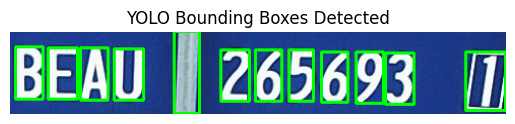

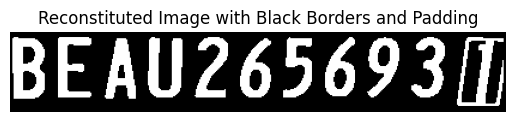

Reconstituted image saved as 'labeled_samples\124126001\1-124126001-OCR-AH-A01\1-124126001-OCR-AH-A01_reconst_0_class0.jpg'
Saved: labeled_samples\124126001\1-124126001-OCR-AH-A01\1-124126001-OCR-AH-A01_reconst_0_class0.jpg
Mean value of the binary image: 76.9973743435859

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\124126001\1-124126001-OCR-AH-A01\1-124126001-OCR-AH-A01_crop_1_class1.jpg: 320x640 4 0s, 93.4ms
Speed: 2.1ms preprocess, 93.4ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 640)


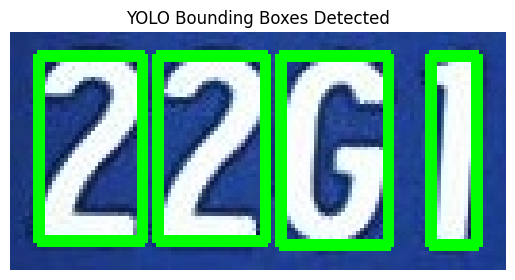

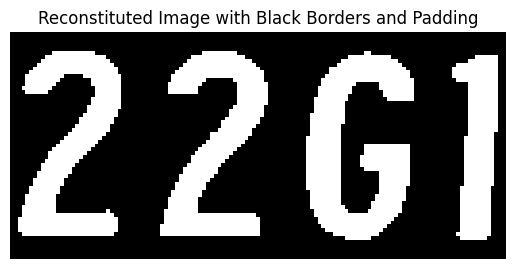

Reconstituted image saved as 'labeled_samples\124126001\1-124126001-OCR-AH-A01\1-124126001-OCR-AH-A01_reconst_1_class1.jpg'
Saved: labeled_samples\124126001\1-124126001-OCR-AH-A01\1-124126001-OCR-AH-A01_reconst_1_class1.jpg
Mean value of the binary image: 68.08656294200848

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\124126001\1-124126001-OCR-AS-B01\1-124126001-OCR-AS-B01_crop_0_class0.jpg: 128x640 15 0s, 53.1ms
Speed: 1.1ms preprocess, 53.1ms inference, 2.8ms postprocess per image at shape (1, 3, 128, 640)


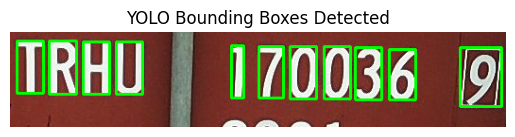

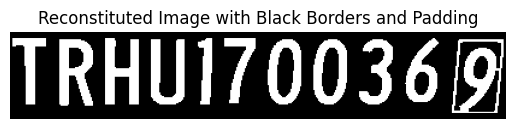

Reconstituted image saved as 'labeled_samples\124126001\1-124126001-OCR-AS-B01\1-124126001-OCR-AS-B01_reconst_0_class0.jpg'
Saved: labeled_samples\124126001\1-124126001-OCR-AS-B01\1-124126001-OCR-AS-B01_reconst_0_class0.jpg
Mean value of the binary image: 70.90745585349902

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\124126001\1-124126001-OCR-AS-B01\1-124126001-OCR-AS-B01_crop_1_class1.jpg: 320x640 4 0s, 136.8ms
Speed: 2.5ms preprocess, 136.8ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 640)


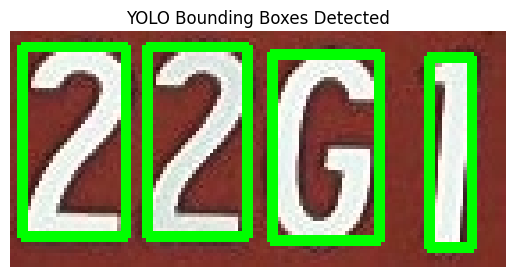

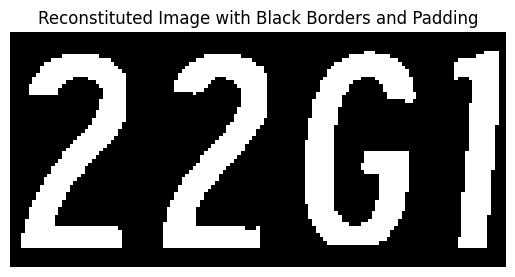

Reconstituted image saved as 'labeled_samples\124126001\1-124126001-OCR-AS-B01\1-124126001-OCR-AS-B01_reconst_1_class1.jpg'
Saved: labeled_samples\124126001\1-124126001-OCR-AS-B01\1-124126001-OCR-AS-B01_reconst_1_class1.jpg
Mean value of the binary image: 66.63062888198758

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\124126001\1-124126001-OCR-LB-C02\1-124126001-OCR-LB-C02_crop_0_class0.jpg: 640x96 11 0s, 59.4ms
Speed: 1.0ms preprocess, 59.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 96)


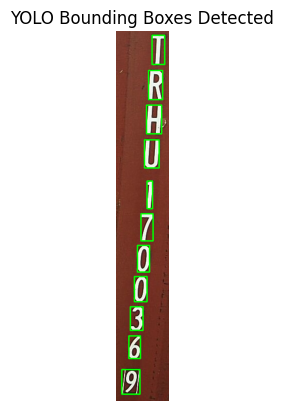

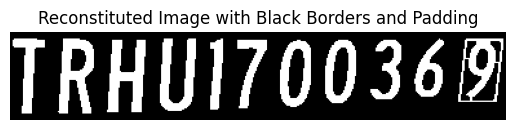

Reconstituted image saved as 'labeled_samples\124126001\1-124126001-OCR-LB-C02\1-124126001-OCR-LB-C02_reconst_0_class0.jpg'
Saved: labeled_samples\124126001\1-124126001-OCR-LB-C02\1-124126001-OCR-LB-C02_reconst_0_class0.jpg
Mean value of the binary image: 67.39229583975347

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\124126001\1-124126001-OCR-LB-C02\1-124126001-OCR-LB-C02_crop_1_class1.jpg: 640x160 4 0s, 49.7ms
Speed: 1.1ms preprocess, 49.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 160)


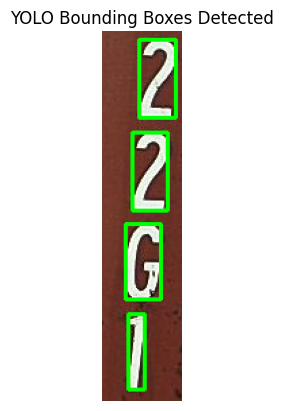

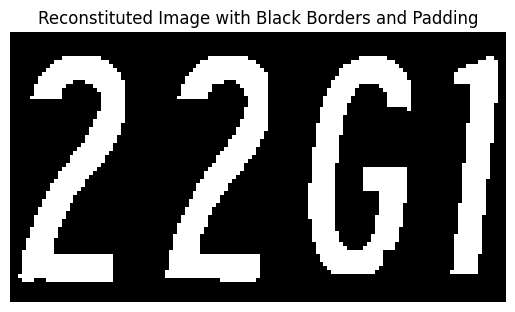

Reconstituted image saved as 'labeled_samples\124126001\1-124126001-OCR-LB-C02\1-124126001-OCR-LB-C02_reconst_1_class1.jpg'
Saved: labeled_samples\124126001\1-124126001-OCR-LB-C02\1-124126001-OCR-LB-C02_reconst_1_class1.jpg
Mean value of the binary image: 57.70632737276479

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\124126001\1-124126001-OCR-LF-C01\1-124126001-OCR-LF-C01_crop_0_class0.jpg: 640x96 11 0s, 48.7ms
Speed: 0.9ms preprocess, 48.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 96)


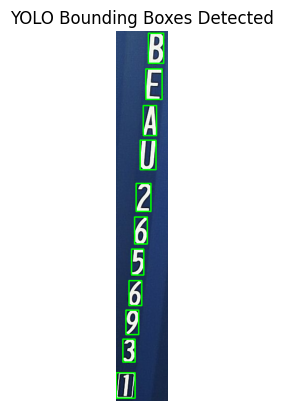

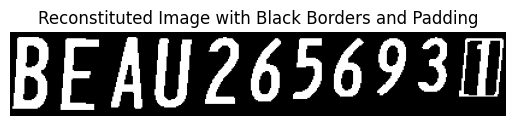

Reconstituted image saved as 'labeled_samples\124126001\1-124126001-OCR-LF-C01\1-124126001-OCR-LF-C01_reconst_0_class0.jpg'
Saved: labeled_samples\124126001\1-124126001-OCR-LF-C01\1-124126001-OCR-LF-C01_reconst_0_class0.jpg
Mean value of the binary image: 67.69090909090909

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\124126001\1-124126001-OCR-LF-C01\1-124126001-OCR-LF-C01_crop_1_class1.jpg: 640x160 4 0s, 67.1ms
Speed: 1.1ms preprocess, 67.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 160)


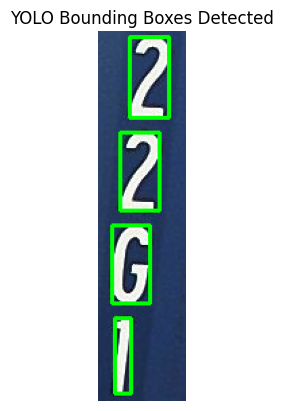

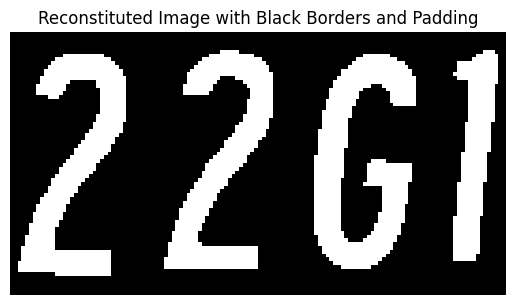

Reconstituted image saved as 'labeled_samples\124126001\1-124126001-OCR-LF-C01\1-124126001-OCR-LF-C01_reconst_1_class1.jpg'
Saved: labeled_samples\124126001\1-124126001-OCR-LF-C01\1-124126001-OCR-LF-C01_reconst_1_class1.jpg
Mean value of the binary image: 51.60247252747253

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\124126001\1-124126001-OCR-RF-D01\1-124126001-OCR-RF-D01_crop_0_class0.jpg: 640x64 11 0s, 26.5ms
Speed: 0.8ms preprocess, 26.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 64)


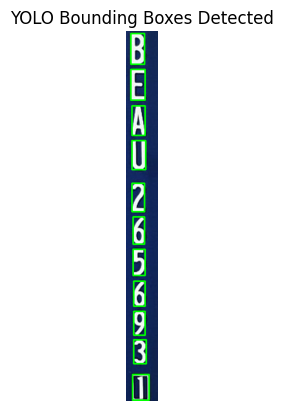

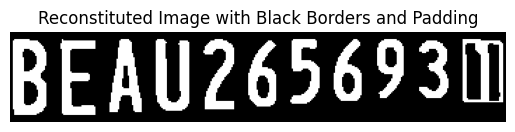

Reconstituted image saved as 'labeled_samples\124126001\1-124126001-OCR-RF-D01\1-124126001-OCR-RF-D01_reconst_0_class0.jpg'
Saved: labeled_samples\124126001\1-124126001-OCR-RF-D01\1-124126001-OCR-RF-D01_reconst_0_class0.jpg
Mean value of the binary image: 60.11534133533383

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\124126001\1-124126001-OCR-RF-D01\1-124126001-OCR-RF-D01_crop_1_class1.jpg: 640x128 4 0s, 49.3ms
Speed: 1.3ms preprocess, 49.3ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 128)


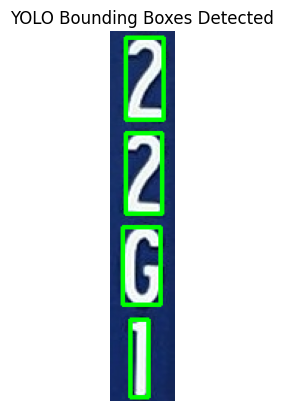

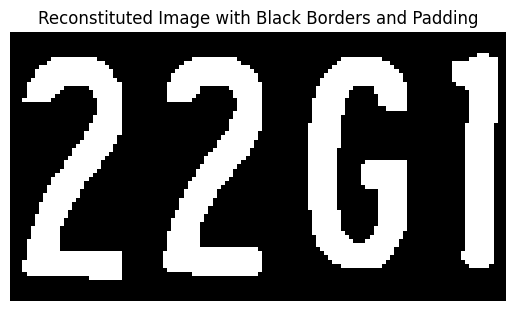

Reconstituted image saved as 'labeled_samples\124126001\1-124126001-OCR-RF-D01\1-124126001-OCR-RF-D01_reconst_1_class1.jpg'
Saved: labeled_samples\124126001\1-124126001-OCR-RF-D01\1-124126001-OCR-RF-D01_reconst_1_class1.jpg
Mean value of the binary image: 66.75815529867458

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\124835001\1-124835001-OCR-AH-A01\1-124835001-OCR-AH-A01_crop_0_class0.jpg: 128x640 11 0s, 43.0ms
Speed: 1.1ms preprocess, 43.0ms inference, 1.6ms postprocess per image at shape (1, 3, 128, 640)


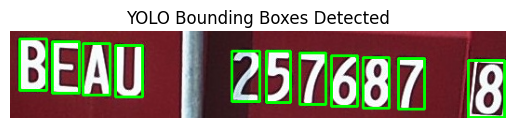

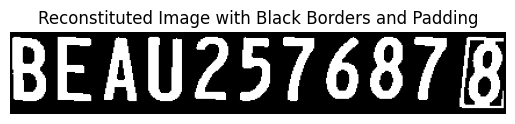

Reconstituted image saved as 'labeled_samples\124835001\1-124835001-OCR-AH-A01\1-124835001-OCR-AH-A01_reconst_0_class0.jpg'
Saved: labeled_samples\124835001\1-124835001-OCR-AH-A01\1-124835001-OCR-AH-A01_reconst_0_class0.jpg
Mean value of the binary image: 88.53221502096835

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\124835001\1-124835001-OCR-AH-A01\1-124835001-OCR-AH-A01_crop_1_class1.jpg: 320x640 4 0s, 83.7ms
Speed: 2.2ms preprocess, 83.7ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 640)


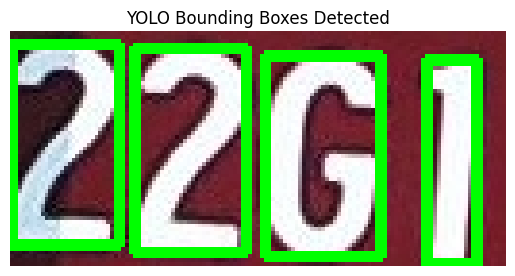

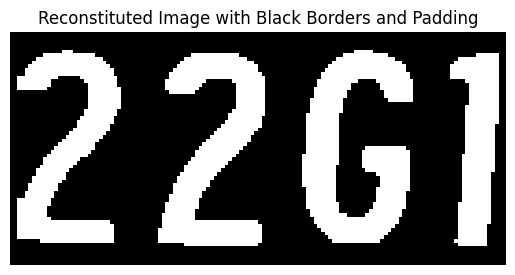

Reconstituted image saved as 'labeled_samples\124835001\1-124835001-OCR-AH-A01\1-124835001-OCR-AH-A01_reconst_1_class1.jpg'
Saved: labeled_samples\124835001\1-124835001-OCR-AH-A01\1-124835001-OCR-AH-A01_reconst_1_class1.jpg
Mean value of the binary image: 67.34257057181263

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\124835001\1-124835001-OCR-AS-B01\1-124835001-OCR-AS-B01_crop_0_class0.jpg: 96x640 12 0s, 35.6ms
Speed: 0.7ms preprocess, 35.6ms inference, 1.0ms postprocess per image at shape (1, 3, 96, 640)


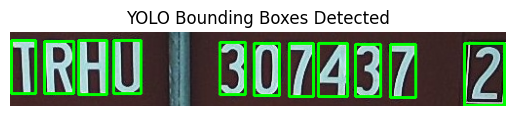

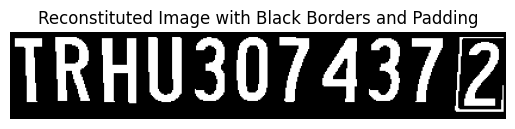

Reconstituted image saved as 'labeled_samples\124835001\1-124835001-OCR-AS-B01\1-124835001-OCR-AS-B01_reconst_0_class0.jpg'
Saved: labeled_samples\124835001\1-124835001-OCR-AS-B01\1-124835001-OCR-AS-B01_reconst_0_class0.jpg
Mean value of the binary image: 69.71223021582733

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\124835001\1-124835001-OCR-AS-B01\1-124835001-OCR-AS-B01_crop_1_class1.jpg: 288x640 4 0s, 89.5ms
Speed: 2.2ms preprocess, 89.5ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 640)


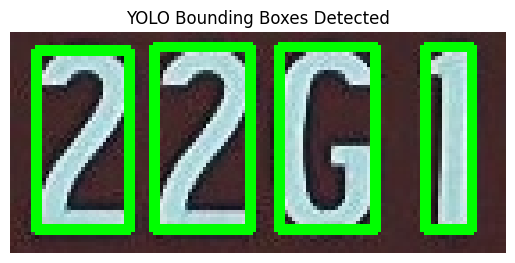

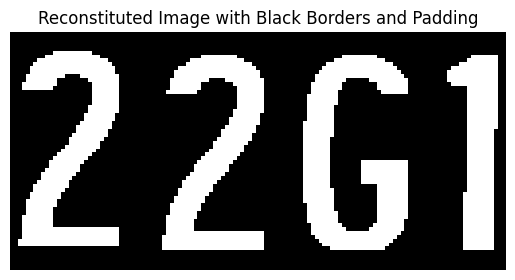

Reconstituted image saved as 'labeled_samples\124835001\1-124835001-OCR-AS-B01\1-124835001-OCR-AS-B01_reconst_1_class1.jpg'
Saved: labeled_samples\124835001\1-124835001-OCR-AS-B01\1-124835001-OCR-AS-B01_reconst_1_class1.jpg
Mean value of the binary image: 57.2364927651666

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\124835001\1-124835001-OCR-LB-C02\1-124835001-OCR-LB-C02_crop_0_class0.jpg: 640x64 11 0s, 38.0ms
Speed: 0.7ms preprocess, 38.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 64)


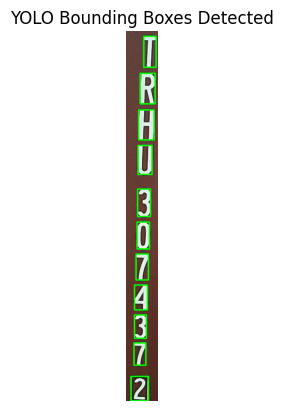

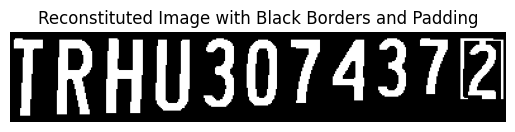

Reconstituted image saved as 'labeled_samples\124835001\1-124835001-OCR-LB-C02\1-124835001-OCR-LB-C02_reconst_0_class0.jpg'
Saved: labeled_samples\124835001\1-124835001-OCR-LB-C02\1-124835001-OCR-LB-C02_reconst_0_class0.jpg
Mean value of the binary image: 67.23930481283422

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\124835001\1-124835001-OCR-LB-C02\1-124835001-OCR-LB-C02_crop_1_class1.jpg: 640x128 4 0s, 73.1ms
Speed: 0.8ms preprocess, 73.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 128)


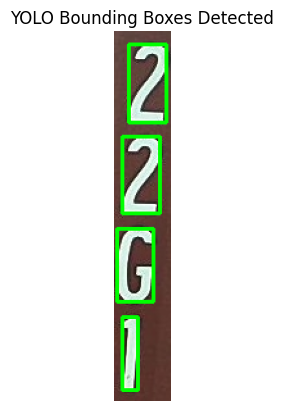

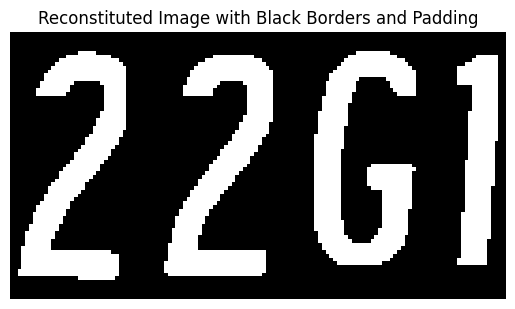

Reconstituted image saved as 'labeled_samples\124835001\1-124835001-OCR-LB-C02\1-124835001-OCR-LB-C02_reconst_1_class1.jpg'
Saved: labeled_samples\124835001\1-124835001-OCR-LB-C02\1-124835001-OCR-LB-C02_reconst_1_class1.jpg
Mean value of the binary image: 60.283378901799956

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\124835001\1-124835001-OCR-LF-C01\1-124835001-OCR-LF-C01_crop_0_class0.jpg: 640x96 11 0s, 43.5ms
Speed: 1.2ms preprocess, 43.5ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 96)


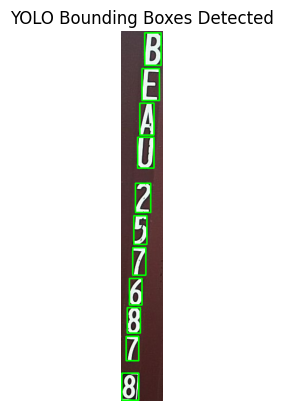

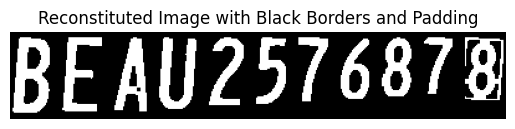

Reconstituted image saved as 'labeled_samples\124835001\1-124835001-OCR-LF-C01\1-124835001-OCR-LF-C01_reconst_0_class0.jpg'
Saved: labeled_samples\124835001\1-124835001-OCR-LF-C01\1-124835001-OCR-LF-C01_reconst_0_class0.jpg
Mean value of the binary image: 82.10843373493977

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\124835001\1-124835001-OCR-LF-C01\1-124835001-OCR-LF-C01_crop_1_class1.jpg: 640x160 4 0s, 53.2ms
Speed: 1.5ms preprocess, 53.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 160)


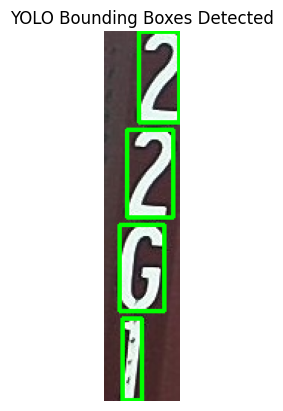

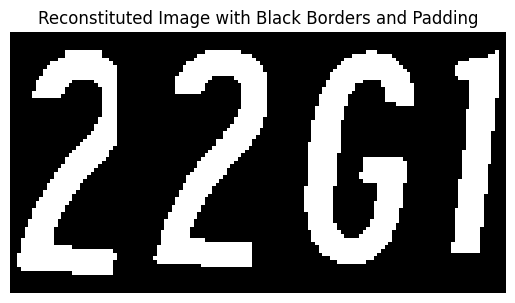

Reconstituted image saved as 'labeled_samples\124835001\1-124835001-OCR-LF-C01\1-124835001-OCR-LF-C01_reconst_1_class1.jpg'
Saved: labeled_samples\124835001\1-124835001-OCR-LF-C01\1-124835001-OCR-LF-C01_reconst_1_class1.jpg
Mean value of the binary image: 58.36810294404367

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\124835001\1-124835001-OCR-RF-D01\1-124835001-OCR-RF-D01_crop_0_class0.jpg: 640x96 11 0s, 48.9ms
Speed: 1.1ms preprocess, 48.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 96)


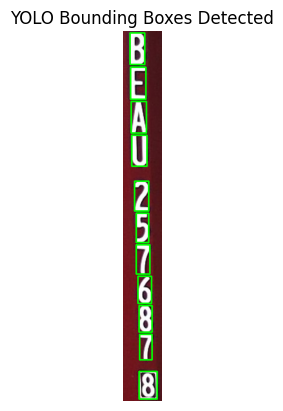

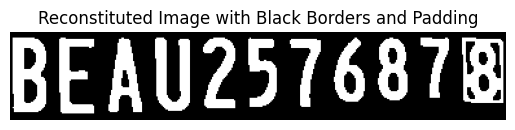

Reconstituted image saved as 'labeled_samples\124835001\1-124835001-OCR-RF-D01\1-124835001-OCR-RF-D01_reconst_0_class0.jpg'
Saved: labeled_samples\124835001\1-124835001-OCR-RF-D01\1-124835001-OCR-RF-D01_reconst_0_class0.jpg
Mean value of the binary image: 69.62773251593127

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\124835001\1-124835001-OCR-RF-D01\1-124835001-OCR-RF-D01_crop_1_class1.jpg: 640x128 4 0s, 52.2ms
Speed: 1.2ms preprocess, 52.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 128)


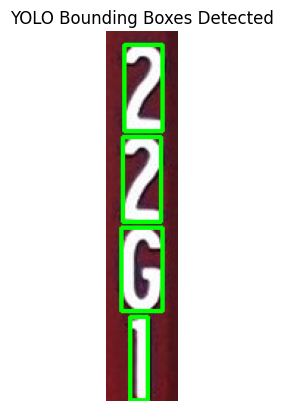

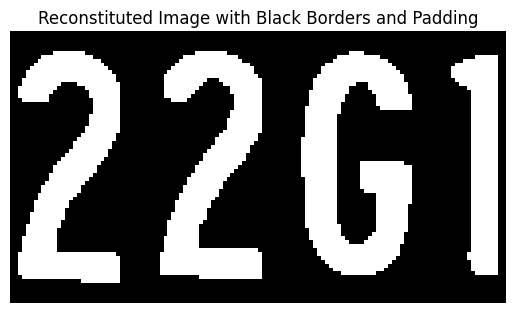

Reconstituted image saved as 'labeled_samples\124835001\1-124835001-OCR-RF-D01\1-124835001-OCR-RF-D01_reconst_1_class1.jpg'
Saved: labeled_samples\124835001\1-124835001-OCR-RF-D01\1-124835001-OCR-RF-D01_reconst_1_class1.jpg
Mean value of the binary image: 60.385416666666664

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\125722001\1-125722001-OCR-AH-A01\1-125722001-OCR-AH-A01_crop_0_class0.jpg: 640x96 11 0s, 40.6ms
Speed: 0.8ms preprocess, 40.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 96)


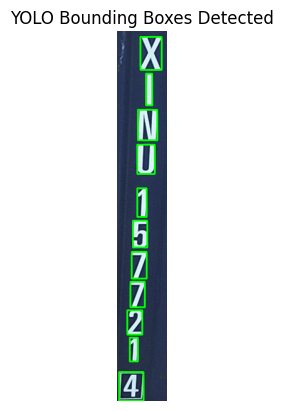

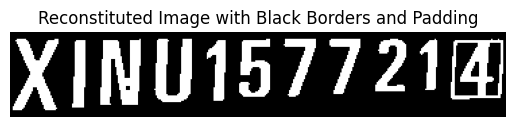

Reconstituted image saved as 'labeled_samples\125722001\1-125722001-OCR-AH-A01\1-125722001-OCR-AH-A01_reconst_0_class0.jpg'
Saved: labeled_samples\125722001\1-125722001-OCR-AH-A01\1-125722001-OCR-AH-A01_reconst_0_class0.jpg
Mean value of the binary image: 71.93915857605178

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\125722001\1-125722001-OCR-AS-B01\1-125722001-OCR-AS-B01_crop_0_class0.jpg: 128x640 12 0s, 46.5ms
Speed: 1.2ms preprocess, 46.5ms inference, 1.2ms postprocess per image at shape (1, 3, 128, 640)


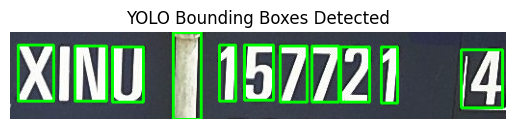

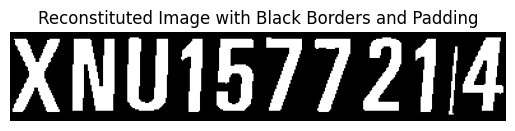

Reconstituted image saved as 'labeled_samples\125722001\1-125722001-OCR-AS-B01\1-125722001-OCR-AS-B01_reconst_0_class0.jpg'
Saved: labeled_samples\125722001\1-125722001-OCR-AS-B01\1-125722001-OCR-AS-B01_reconst_0_class0.jpg
Mean value of the binary image: 88.26506791171477

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\125722001\1-125722001-OCR-AS-B01\1-125722001-OCR-AS-B01_crop_1_class1.jpg: 416x640 4 0s, 131.0ms
Speed: 5.6ms preprocess, 131.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


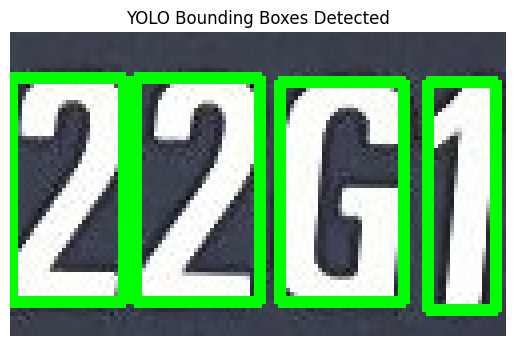

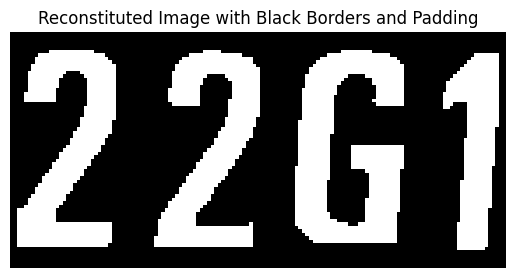

Reconstituted image saved as 'labeled_samples\125722001\1-125722001-OCR-AS-B01\1-125722001-OCR-AS-B01_reconst_1_class1.jpg'
Saved: labeled_samples\125722001\1-125722001-OCR-AS-B01\1-125722001-OCR-AS-B01_reconst_1_class1.jpg
Mean value of the binary image: 88.2592142515481

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\125722001\1-125722001-OCR-LB-C02\1-125722001-OCR-LB-C02_crop_0_class0.jpg: 640x96 11 0s, 35.9ms
Speed: 0.9ms preprocess, 35.9ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 96)


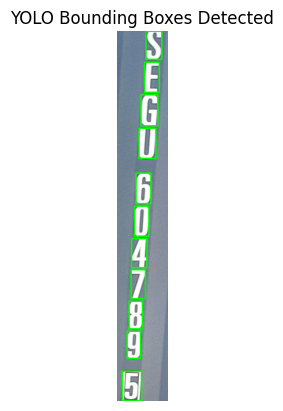

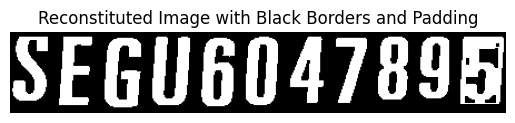

Reconstituted image saved as 'labeled_samples\125722001\1-125722001-OCR-LB-C02\1-125722001-OCR-LB-C02_reconst_0_class0.jpg'
Saved: labeled_samples\125722001\1-125722001-OCR-LB-C02\1-125722001-OCR-LB-C02_reconst_0_class0.jpg
Mean value of the binary image: 93.60687022900764

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\125722001\1-125722001-OCR-LB-C02\1-125722001-OCR-LB-C02_crop_1_class1.jpg: 640x192 4 0s, 212.4ms
Speed: 1.7ms preprocess, 212.4ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 192)


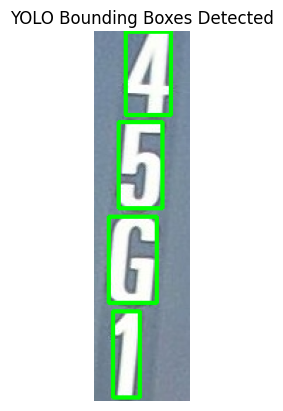

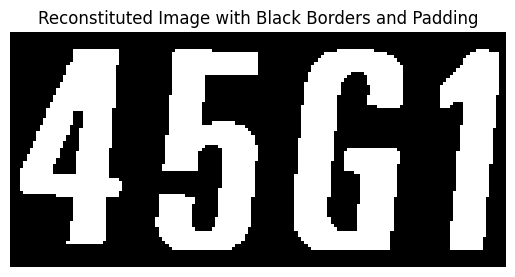

Reconstituted image saved as 'labeled_samples\125722001\1-125722001-OCR-LB-C02\1-125722001-OCR-LB-C02_reconst_1_class1.jpg'
Saved: labeled_samples\125722001\1-125722001-OCR-LB-C02\1-125722001-OCR-LB-C02_reconst_1_class1.jpg
Mean value of the binary image: 68.2113938692886

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\125722001\1-125722001-OCR-LF-C01\1-125722001-OCR-LF-C01_crop_0_class0.jpg: 640x96 11 0s, 39.0ms
Speed: 1.1ms preprocess, 39.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 96)


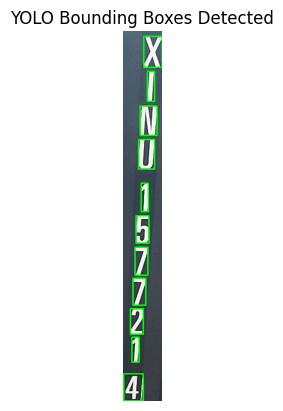

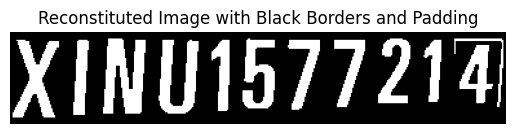

Reconstituted image saved as 'labeled_samples\125722001\1-125722001-OCR-LF-C01\1-125722001-OCR-LF-C01_reconst_0_class0.jpg'
Saved: labeled_samples\125722001\1-125722001-OCR-LF-C01\1-125722001-OCR-LF-C01_reconst_0_class0.jpg
Mean value of the binary image: 74.03105861767278

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\125722001\1-125722001-OCR-LF-C01\1-125722001-OCR-LF-C01_crop_1_class1.jpg: 640x160 4 0s, 57.3ms
Speed: 1.0ms preprocess, 57.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 160)


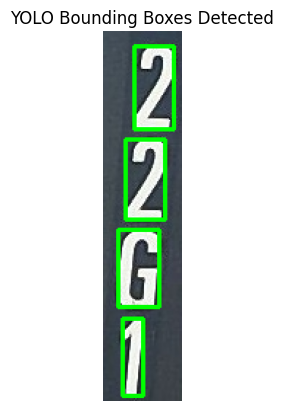

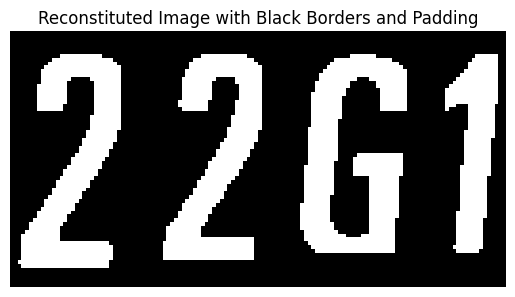

Reconstituted image saved as 'labeled_samples\125722001\1-125722001-OCR-LF-C01\1-125722001-OCR-LF-C01_reconst_1_class1.jpg'
Saved: labeled_samples\125722001\1-125722001-OCR-LF-C01\1-125722001-OCR-LF-C01_reconst_1_class1.jpg
Mean value of the binary image: 48.90909090909091

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\125722001\1-125722001-OCR-RF-D01\1-125722001-OCR-RF-D01_crop_0_class0.jpg: 640x96 11 0s, 86.3ms
Speed: 1.5ms preprocess, 86.3ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 96)


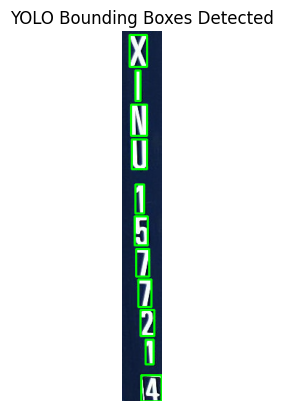

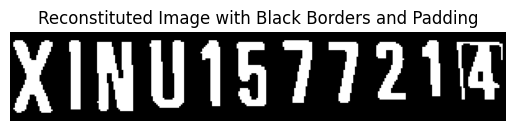

Reconstituted image saved as 'labeled_samples\125722001\1-125722001-OCR-RF-D01\1-125722001-OCR-RF-D01_reconst_0_class0.jpg'
Saved: labeled_samples\125722001\1-125722001-OCR-RF-D01\1-125722001-OCR-RF-D01_reconst_0_class0.jpg
Mean value of the binary image: 61.12414187643021

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\125722001\1-125722001-OCR-RF-D01\1-125722001-OCR-RF-D01_crop_1_class1.jpg: 640x160 4 0s, 59.2ms
Speed: 1.1ms preprocess, 59.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 160)


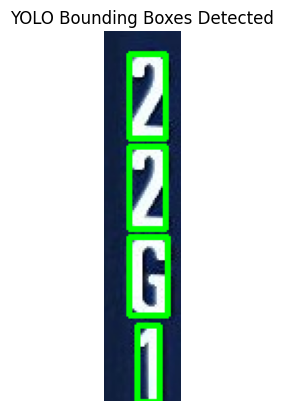

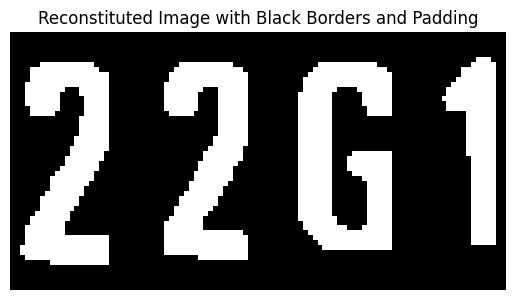

Reconstituted image saved as 'labeled_samples\125722001\1-125722001-OCR-RF-D01\1-125722001-OCR-RF-D01_reconst_1_class1.jpg'
Saved: labeled_samples\125722001\1-125722001-OCR-RF-D01\1-125722001-OCR-RF-D01_reconst_1_class1.jpg
Mean value of the binary image: 83.66774020397209

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\130713001\1-130713001-OCR-AH-A01\1-130713001-OCR-AH-A01_crop_0_class0.jpg: 640x96 11 0s, 50.4ms
Speed: 1.1ms preprocess, 50.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 96)


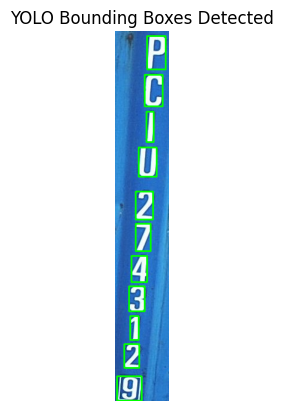

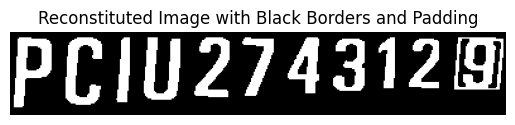

Reconstituted image saved as 'labeled_samples\130713001\1-130713001-OCR-AH-A01\1-130713001-OCR-AH-A01_reconst_0_class0.jpg'
Saved: labeled_samples\130713001\1-130713001-OCR-AH-A01\1-130713001-OCR-AH-A01_reconst_0_class0.jpg
Mean value of the binary image: 76.48507025761124

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\130713001\1-130713001-OCR-AS-B01\1-130713001-OCR-AS-B01_crop_0_class0.jpg: 96x640 12 0s, 47.1ms
Speed: 3.1ms preprocess, 47.1ms inference, 1.1ms postprocess per image at shape (1, 3, 96, 640)


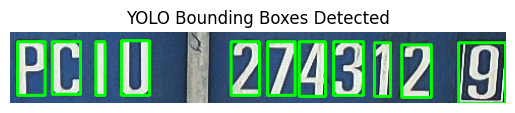

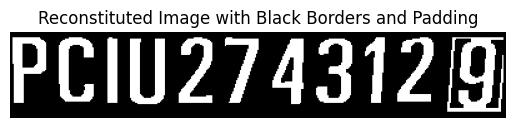

Reconstituted image saved as 'labeled_samples\130713001\1-130713001-OCR-AS-B01\1-130713001-OCR-AS-B01_reconst_0_class0.jpg'
Saved: labeled_samples\130713001\1-130713001-OCR-AS-B01\1-130713001-OCR-AS-B01_reconst_0_class0.jpg
Mean value of the binary image: 77.2238788167939

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\130713001\1-130713001-OCR-AS-B01\1-130713001-OCR-AS-B01_crop_1_class1.jpg: 320x640 4 0s, 103.6ms
Speed: 1.9ms preprocess, 103.6ms inference, 1.7ms postprocess per image at shape (1, 3, 320, 640)


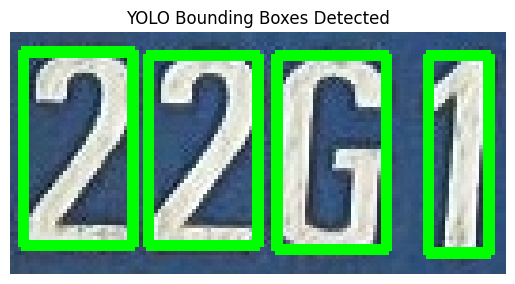

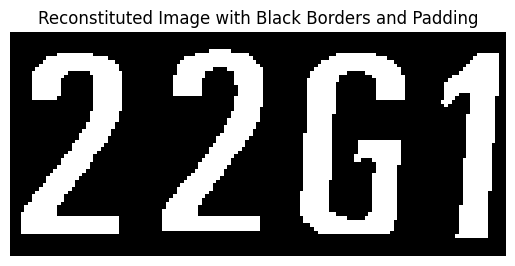

Reconstituted image saved as 'labeled_samples\130713001\1-130713001-OCR-AS-B01\1-130713001-OCR-AS-B01_reconst_1_class1.jpg'
Saved: labeled_samples\130713001\1-130713001-OCR-AS-B01\1-130713001-OCR-AS-B01_reconst_1_class1.jpg
Mean value of the binary image: 94.89965796454

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\130713001\1-130713001-OCR-LB-C02\1-130713001-OCR-LB-C02_crop_0_class0.jpg: 640x96 11 0s, 56.1ms
Speed: 1.2ms preprocess, 56.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 96)


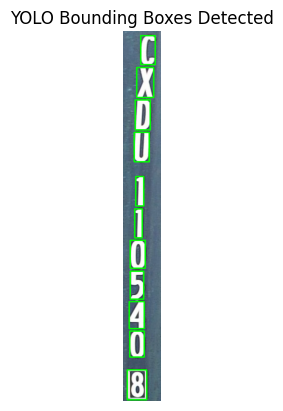

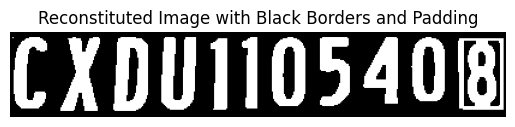

Reconstituted image saved as 'labeled_samples\130713001\1-130713001-OCR-LB-C02\1-130713001-OCR-LB-C02_reconst_0_class0.jpg'
Saved: labeled_samples\130713001\1-130713001-OCR-LB-C02\1-130713001-OCR-LB-C02_reconst_0_class0.jpg
Mean value of the binary image: 98.26136715125271

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\130713001\1-130713001-OCR-LB-C02\1-130713001-OCR-LB-C02_crop_1_class1.jpg: 640x160 4 0s, 72.9ms
Speed: 1.1ms preprocess, 72.9ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 160)


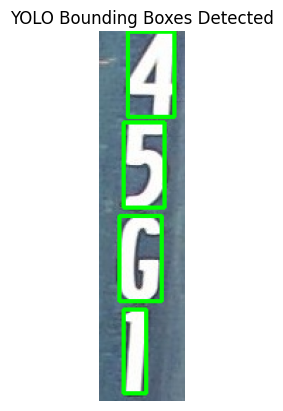

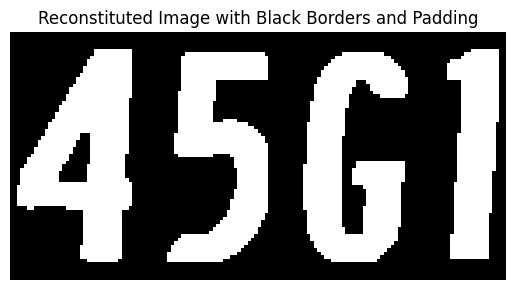

Reconstituted image saved as 'labeled_samples\130713001\1-130713001-OCR-LB-C02\1-130713001-OCR-LB-C02_reconst_1_class1.jpg'
Saved: labeled_samples\130713001\1-130713001-OCR-LB-C02\1-130713001-OCR-LB-C02_reconst_1_class1.jpg
Mean value of the binary image: 78.96153846153847

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\130713001\1-130713001-OCR-LF-C01\1-130713001-OCR-LF-C01_crop_0_class1.jpg: 320x640 4 0s, 96.3ms
Speed: 3.2ms preprocess, 96.3ms inference, 2.0ms postprocess per image at shape (1, 3, 320, 640)


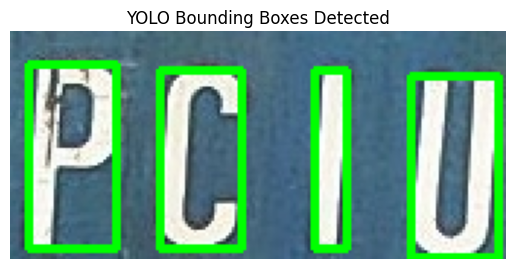

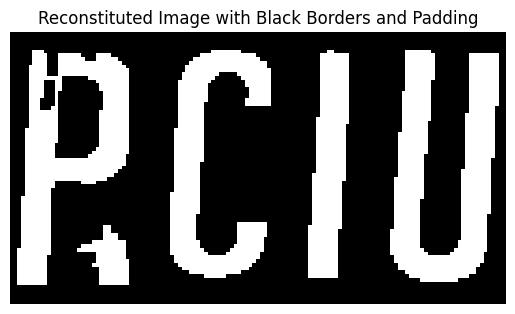

Reconstituted image saved as 'labeled_samples\130713001\1-130713001-OCR-LF-C01\1-130713001-OCR-LF-C01_reconst_0_class1.jpg'
Saved: labeled_samples\130713001\1-130713001-OCR-LF-C01\1-130713001-OCR-LF-C01_reconst_0_class1.jpg
Mean value of the binary image: 76.07024580512217

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\130713001\1-130713001-OCR-LF-C01\1-130713001-OCR-LF-C01_crop_1_class-1.jpg: 160x640 9 0s, 69.7ms
Speed: 1.9ms preprocess, 69.7ms inference, 1.1ms postprocess per image at shape (1, 3, 160, 640)


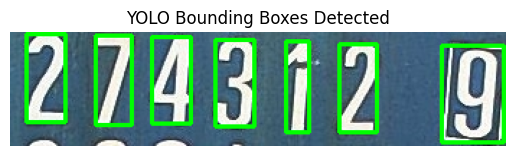

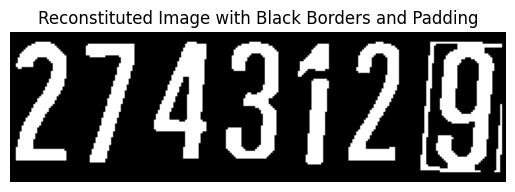

Reconstituted image saved as 'labeled_samples\130713001\1-130713001-OCR-LF-C01\1-130713001-OCR-LF-C01_reconst_1_class-1.jpg'
Saved: labeled_samples\130713001\1-130713001-OCR-LF-C01\1-130713001-OCR-LF-C01_reconst_1_class-1.jpg
Mean value of the binary image: 73.97387496224705

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\130713001\1-130713001-OCR-LF-C01\1-130713001-OCR-LF-C01_crop_2_class1.jpg: 288x640 4 0s, 93.3ms
Speed: 2.8ms preprocess, 93.3ms inference, 1.5ms postprocess per image at shape (1, 3, 288, 640)


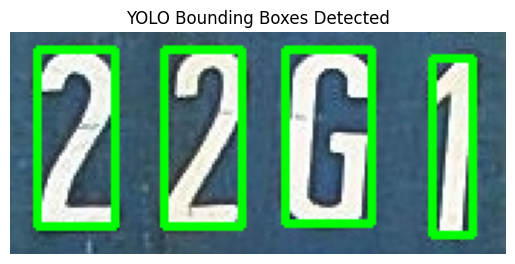

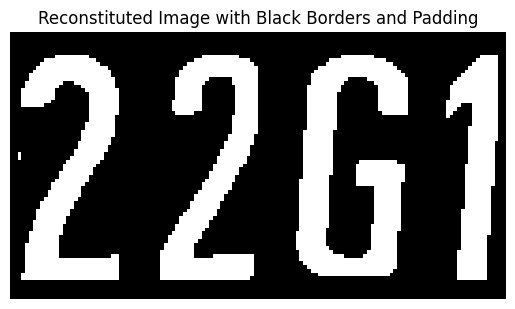

Reconstituted image saved as 'labeled_samples\130713001\1-130713001-OCR-LF-C01\1-130713001-OCR-LF-C01_reconst_2_class1.jpg'
Saved: labeled_samples\130713001\1-130713001-OCR-LF-C01\1-130713001-OCR-LF-C01_reconst_2_class1.jpg
Mean value of the binary image: 67.98701298701299

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\130713001\1-130713001-OCR-RF-D01\1-130713001-OCR-RF-D01_crop_0_class1.jpg: 288x640 4 0s, 94.6ms
Speed: 2.0ms preprocess, 94.6ms inference, 1.7ms postprocess per image at shape (1, 3, 288, 640)


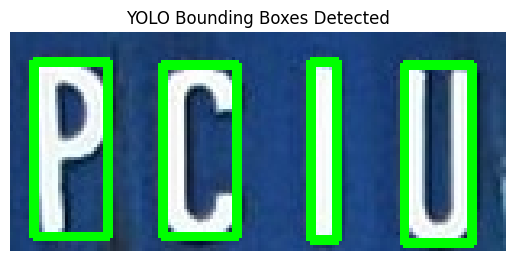

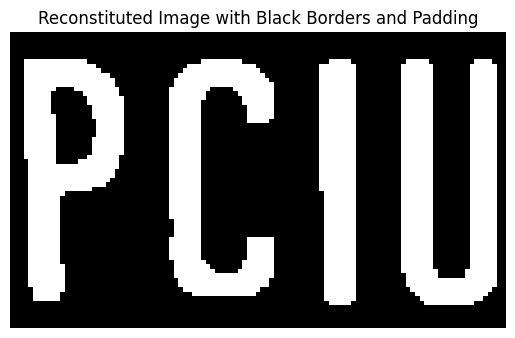

Reconstituted image saved as 'labeled_samples\130713001\1-130713001-OCR-RF-D01\1-130713001-OCR-RF-D01_reconst_0_class1.jpg'
Saved: labeled_samples\130713001\1-130713001-OCR-RF-D01\1-130713001-OCR-RF-D01_reconst_0_class1.jpg
Mean value of the binary image: 70.21593594119192

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\130713001\1-130713001-OCR-RF-D01\1-130713001-OCR-RF-D01_crop_1_class-1.jpg: 192x640 11 0s, 73.0ms
Speed: 1.3ms preprocess, 73.0ms inference, 1.3ms postprocess per image at shape (1, 3, 192, 640)


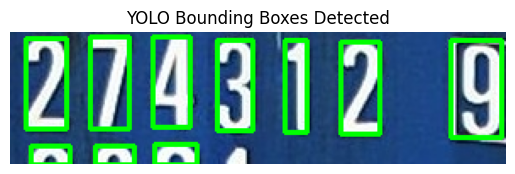

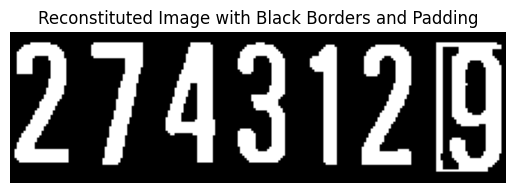

Reconstituted image saved as 'labeled_samples\130713001\1-130713001-OCR-RF-D01\1-130713001-OCR-RF-D01_reconst_1_class-1.jpg'
Saved: labeled_samples\130713001\1-130713001-OCR-RF-D01\1-130713001-OCR-RF-D01_reconst_1_class-1.jpg
Mean value of the binary image: 71.57942430703625

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\130713001\1-130713001-OCR-RF-D01\1-130713001-OCR-RF-D01_crop_2_class1.jpg: 320x640 4 0s, 87.3ms
Speed: 1.9ms preprocess, 87.3ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 640)


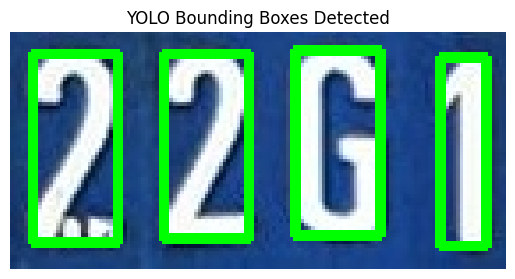

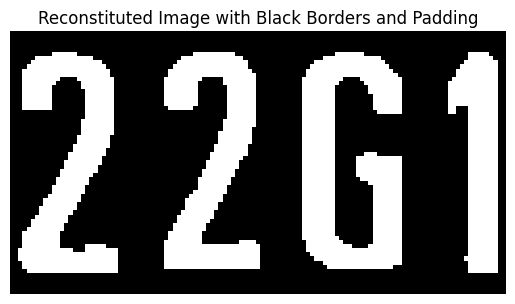

Reconstituted image saved as 'labeled_samples\130713001\1-130713001-OCR-RF-D01\1-130713001-OCR-RF-D01_reconst_2_class1.jpg'
Saved: labeled_samples\130713001\1-130713001-OCR-RF-D01\1-130713001-OCR-RF-D01_reconst_2_class1.jpg
Mean value of the binary image: 118.28527706185567

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\142900001\1-142900001-OCR-AH-A01\1-142900001-OCR-AH-A01_crop_0_class1.jpg: 320x640 4 0s, 103.5ms
Speed: 2.7ms preprocess, 103.5ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 640)


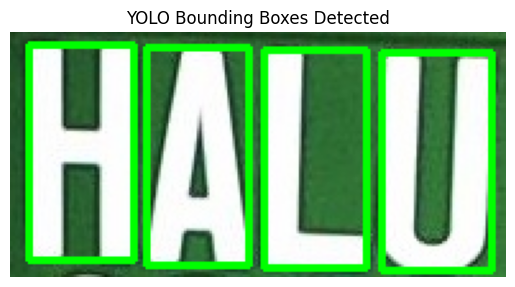

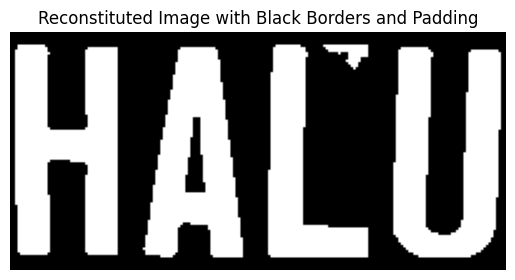

Reconstituted image saved as 'labeled_samples\142900001\1-142900001-OCR-AH-A01\1-142900001-OCR-AH-A01_reconst_0_class1.jpg'
Saved: labeled_samples\142900001\1-142900001-OCR-AH-A01\1-142900001-OCR-AH-A01_reconst_0_class1.jpg
Mean value of the binary image: 123.1956289978678

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\142900001\1-142900001-OCR-AH-A01\1-142900001-OCR-AH-A01_crop_1_class-1.jpg: 160x640 13 0s, 53.7ms
Speed: 1.2ms preprocess, 53.7ms inference, 1.8ms postprocess per image at shape (1, 3, 160, 640)


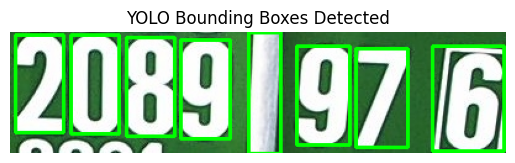

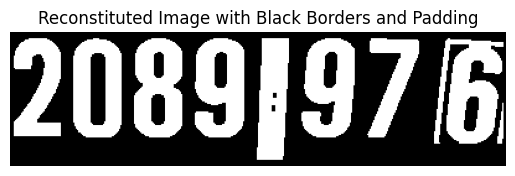

Reconstituted image saved as 'labeled_samples\142900001\1-142900001-OCR-AH-A01\1-142900001-OCR-AH-A01_reconst_1_class-1.jpg'
Saved: labeled_samples\142900001\1-142900001-OCR-AH-A01\1-142900001-OCR-AH-A01_reconst_1_class-1.jpg
Mean value of the binary image: 111.02186711522288

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\142900001\1-142900001-OCR-AH-A01\1-142900001-OCR-AH-A01_crop_2_class1.jpg: 320x640 4 0s, 101.4ms
Speed: 2.0ms preprocess, 101.4ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 640)


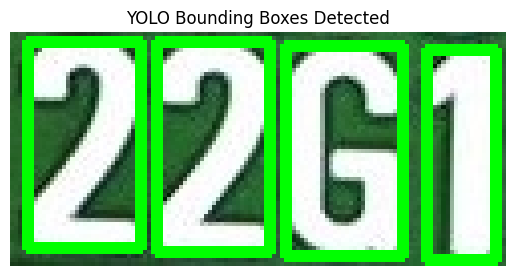

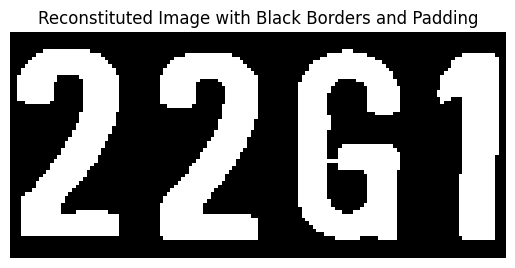

Reconstituted image saved as 'labeled_samples\142900001\1-142900001-OCR-AH-A01\1-142900001-OCR-AH-A01_reconst_2_class1.jpg'
Saved: labeled_samples\142900001\1-142900001-OCR-AH-A01\1-142900001-OCR-AH-A01_reconst_2_class1.jpg
Mean value of the binary image: 76.76118082368082

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\142900001\1-142900001-OCR-AS-B01\1-142900001-OCR-AS-B01_crop_0_class0.jpg: 96x640 12 0s, 52.3ms
Speed: 1.4ms preprocess, 52.3ms inference, 1.1ms postprocess per image at shape (1, 3, 96, 640)


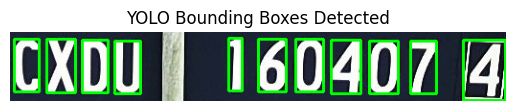

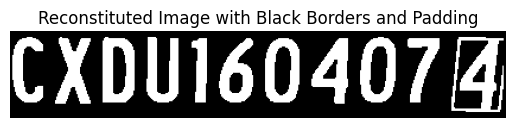

Reconstituted image saved as 'labeled_samples\142900001\1-142900001-OCR-AS-B01\1-142900001-OCR-AS-B01_reconst_0_class0.jpg'
Saved: labeled_samples\142900001\1-142900001-OCR-AS-B01\1-142900001-OCR-AS-B01_reconst_0_class0.jpg
Mean value of the binary image: 72.72173464119773

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\142900001\1-142900001-OCR-AS-B01\1-142900001-OCR-AS-B01_crop_1_class1.jpg: 288x640 4 0s, 89.8ms
Speed: 2.4ms preprocess, 89.8ms inference, 1.3ms postprocess per image at shape (1, 3, 288, 640)


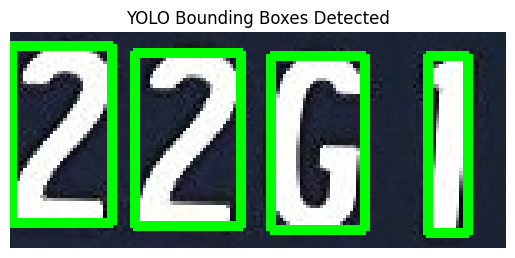

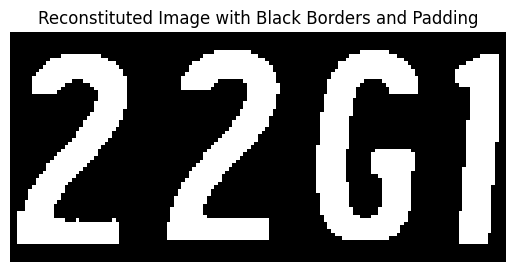

Reconstituted image saved as 'labeled_samples\142900001\1-142900001-OCR-AS-B01\1-142900001-OCR-AS-B01_reconst_1_class1.jpg'
Saved: labeled_samples\142900001\1-142900001-OCR-AS-B01\1-142900001-OCR-AS-B01_reconst_1_class1.jpg
Mean value of the binary image: 53.576091289615306

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\142900001\1-142900001-OCR-LB-C02\1-142900001-OCR-LB-C02_crop_0_class0.jpg: 640x96 11 0s, 39.2ms
Speed: 0.9ms preprocess, 39.2ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 96)


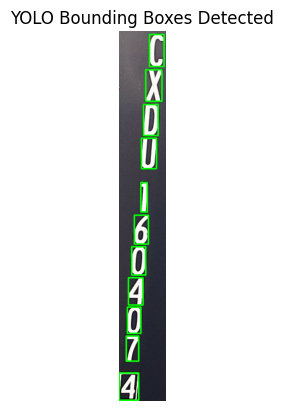

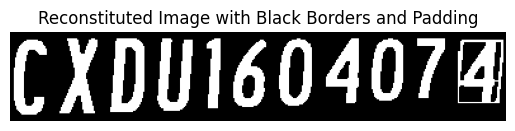

Reconstituted image saved as 'labeled_samples\142900001\1-142900001-OCR-LB-C02\1-142900001-OCR-LB-C02_reconst_0_class0.jpg'
Saved: labeled_samples\142900001\1-142900001-OCR-LB-C02\1-142900001-OCR-LB-C02_reconst_0_class0.jpg
Mean value of the binary image: 62.847081712062256

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\142900001\1-142900001-OCR-LB-C02\1-142900001-OCR-LB-C02_crop_1_class1.jpg: 640x128 4 0s, 58.4ms
Speed: 1.2ms preprocess, 58.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 128)


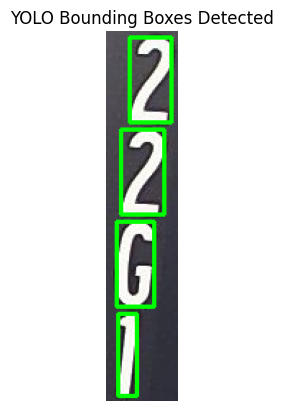

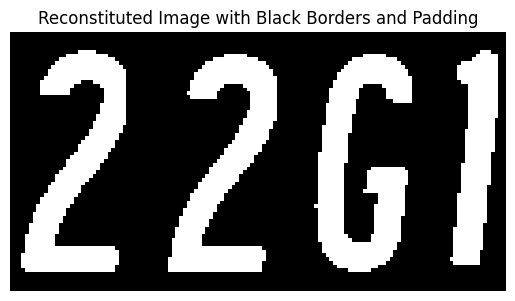

Reconstituted image saved as 'labeled_samples\142900001\1-142900001-OCR-LB-C02\1-142900001-OCR-LB-C02_reconst_1_class1.jpg'
Saved: labeled_samples\142900001\1-142900001-OCR-LB-C02\1-142900001-OCR-LB-C02_reconst_1_class1.jpg
Mean value of the binary image: 86.47625160462131

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\142900001\1-142900001-OCR-LF-C01\1-142900001-OCR-LF-C01_crop_0_class1.jpg: 256x640 4 0s, 81.5ms
Speed: 2.0ms preprocess, 81.5ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 640)


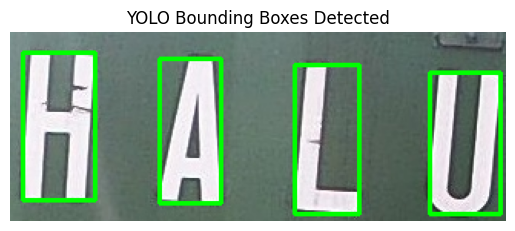

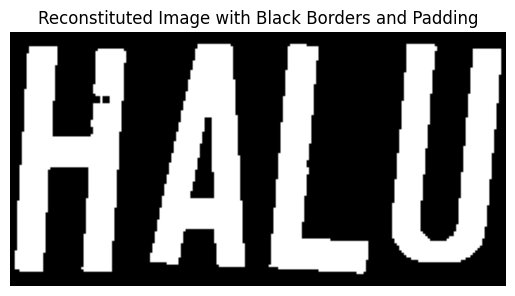

Reconstituted image saved as 'labeled_samples\142900001\1-142900001-OCR-LF-C01\1-142900001-OCR-LF-C01_reconst_0_class1.jpg'
Saved: labeled_samples\142900001\1-142900001-OCR-LF-C01\1-142900001-OCR-LF-C01_reconst_0_class1.jpg
Mean value of the binary image: 78.9252151938719

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\142900001\1-142900001-OCR-LF-C01\1-142900001-OCR-LF-C01_crop_1_class-1.jpg: 160x640 7 0s, 206.3ms
Speed: 5.5ms preprocess, 206.3ms inference, 1.4ms postprocess per image at shape (1, 3, 160, 640)


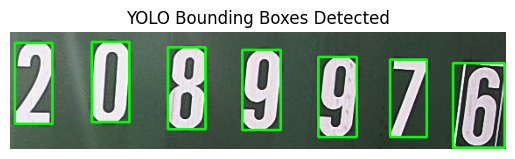

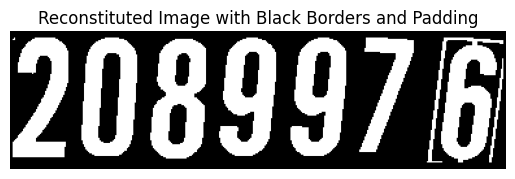

Reconstituted image saved as 'labeled_samples\142900001\1-142900001-OCR-LF-C01\1-142900001-OCR-LF-C01_reconst_1_class-1.jpg'
Saved: labeled_samples\142900001\1-142900001-OCR-LF-C01\1-142900001-OCR-LF-C01_reconst_1_class-1.jpg
Mean value of the binary image: 69.24039564220183

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\142900001\1-142900001-OCR-LF-C01\1-142900001-OCR-LF-C01_crop_2_class1.jpg: 224x640 4 0s, 67.7ms
Speed: 1.7ms preprocess, 67.7ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 640)


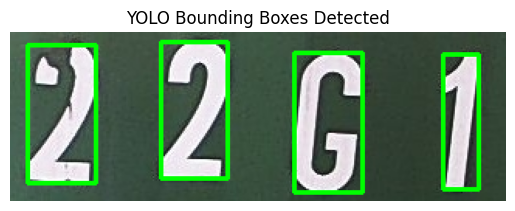

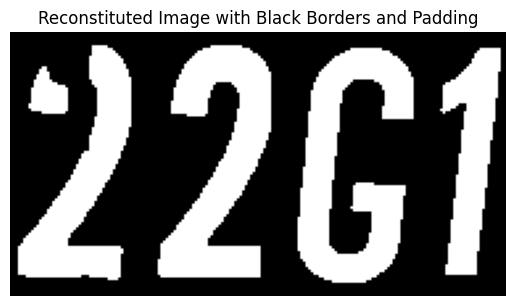

Reconstituted image saved as 'labeled_samples\142900001\1-142900001-OCR-LF-C01\1-142900001-OCR-LF-C01_reconst_2_class1.jpg'
Saved: labeled_samples\142900001\1-142900001-OCR-LF-C01\1-142900001-OCR-LF-C01_reconst_2_class1.jpg
Mean value of the binary image: 82.5500943807173

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\142900001\1-142900001-OCR-RF-D01\1-142900001-OCR-RF-D01_crop_0_class1.jpg: 224x640 4 0s, 82.2ms
Speed: 1.6ms preprocess, 82.2ms inference, 1.3ms postprocess per image at shape (1, 3, 224, 640)


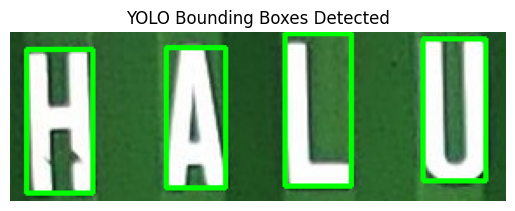

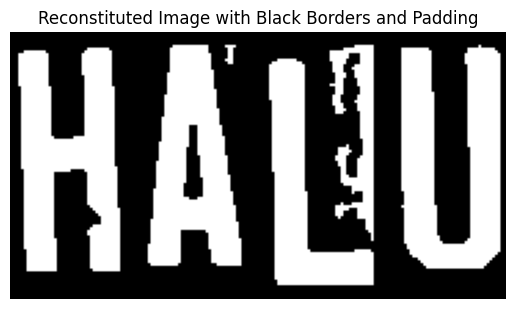

Reconstituted image saved as 'labeled_samples\142900001\1-142900001-OCR-RF-D01\1-142900001-OCR-RF-D01_reconst_0_class1.jpg'
Saved: labeled_samples\142900001\1-142900001-OCR-RF-D01\1-142900001-OCR-RF-D01_reconst_0_class1.jpg
Mean value of the binary image: 89.53373015873017

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\142900001\1-142900001-OCR-RF-D01\1-142900001-OCR-RF-D01_crop_1_class-1.jpg: 160x640 7 0s, 58.2ms
Speed: 1.1ms preprocess, 58.2ms inference, 1.3ms postprocess per image at shape (1, 3, 160, 640)


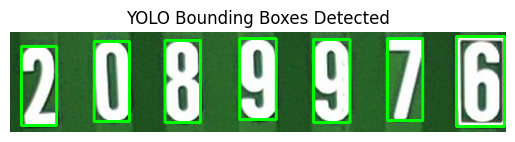

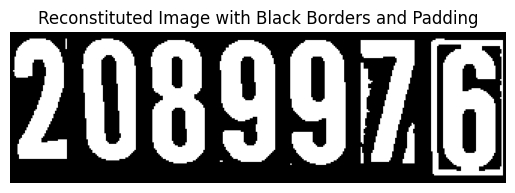

Reconstituted image saved as 'labeled_samples\142900001\1-142900001-OCR-RF-D01\1-142900001-OCR-RF-D01_reconst_1_class-1.jpg'
Saved: labeled_samples\142900001\1-142900001-OCR-RF-D01\1-142900001-OCR-RF-D01_reconst_1_class-1.jpg
Mean value of the binary image: 79.420333655706

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\142900001\1-142900001-OCR-RF-D01\1-142900001-OCR-RF-D01_crop_2_class1.jpg: 256x640 4 0s, 86.9ms
Speed: 2.5ms preprocess, 86.9ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 640)


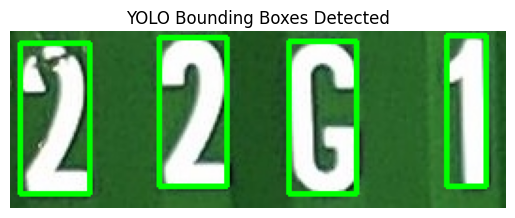

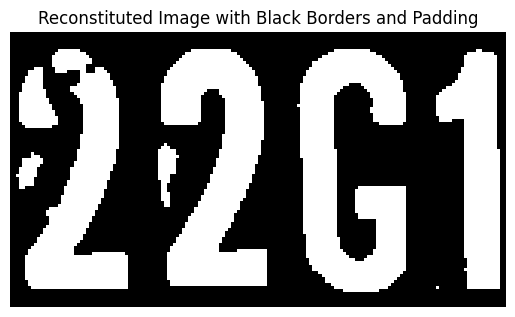

Reconstituted image saved as 'labeled_samples\142900001\1-142900001-OCR-RF-D01\1-142900001-OCR-RF-D01_reconst_2_class1.jpg'
Saved: labeled_samples\142900001\1-142900001-OCR-RF-D01\1-142900001-OCR-RF-D01_reconst_2_class1.jpg
Mean value of the binary image: 125.25469965427831

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\144241001\1-144241001-OCR-AH-A01\1-144241001-OCR-AH-A01_crop_0_class0.jpg: 640x96 14 0s, 40.3ms
Speed: 1.1ms preprocess, 40.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 96)


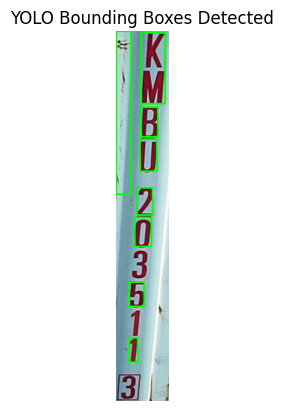

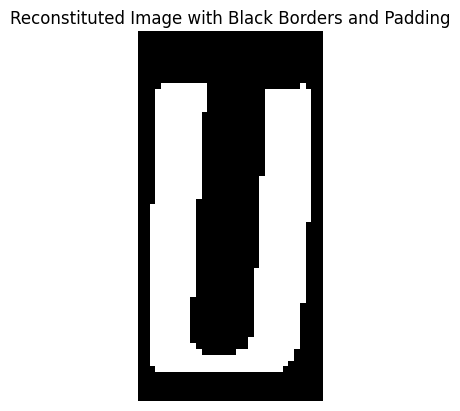

Reconstituted image saved as 'labeled_samples\144241001\1-144241001-OCR-AH-A01\1-144241001-OCR-AH-A01_reconst_0_class0.jpg'
Saved: labeled_samples\144241001\1-144241001-OCR-AH-A01\1-144241001-OCR-AH-A01_reconst_0_class0.jpg
Mean value of the binary image: 82.10272373540856

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\144241001\1-144241001-OCR-AS-B01\1-144241001-OCR-AS-B01_crop_0_class0.jpg: 96x640 12 0s, 54.5ms
Speed: 2.8ms preprocess, 54.5ms inference, 1.2ms postprocess per image at shape (1, 3, 96, 640)


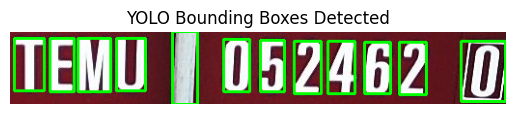

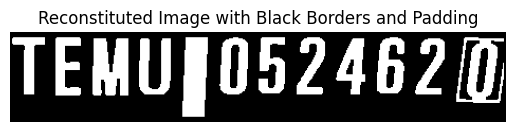

Reconstituted image saved as 'labeled_samples\144241001\1-144241001-OCR-AS-B01\1-144241001-OCR-AS-B01_reconst_0_class0.jpg'
Saved: labeled_samples\144241001\1-144241001-OCR-AS-B01\1-144241001-OCR-AS-B01_reconst_0_class0.jpg
Mean value of the binary image: 72.91437549096622

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\144241001\1-144241001-OCR-AS-B01\1-144241001-OCR-AS-B01_crop_1_class1.jpg: 288x640 4 0s, 117.4ms
Speed: 2.2ms preprocess, 117.4ms inference, 1.6ms postprocess per image at shape (1, 3, 288, 640)


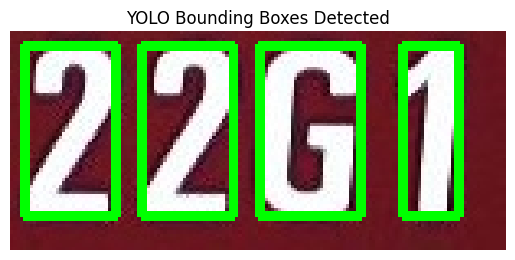

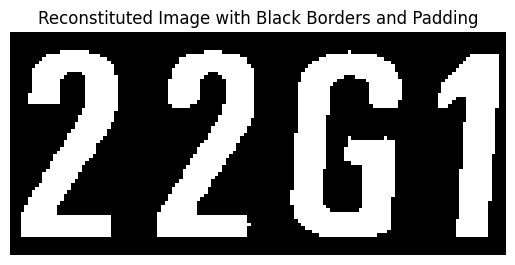

Reconstituted image saved as 'labeled_samples\144241001\1-144241001-OCR-AS-B01\1-144241001-OCR-AS-B01_reconst_1_class1.jpg'
Saved: labeled_samples\144241001\1-144241001-OCR-AS-B01\1-144241001-OCR-AS-B01_reconst_1_class1.jpg
Mean value of the binary image: 63.95720476706392

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\144241001\1-144241001-OCR-LB-C02\1-144241001-OCR-LB-C02_crop_0_class0.jpg: 640x96 11 0s, 51.9ms
Speed: 0.9ms preprocess, 51.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 96)


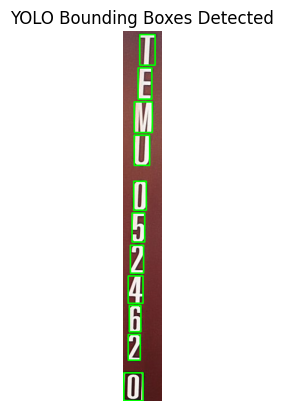

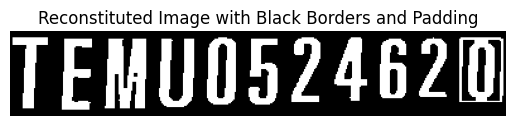

Reconstituted image saved as 'labeled_samples\144241001\1-144241001-OCR-LB-C02\1-144241001-OCR-LB-C02_reconst_0_class0.jpg'
Saved: labeled_samples\144241001\1-144241001-OCR-LB-C02\1-144241001-OCR-LB-C02_reconst_0_class0.jpg
Mean value of the binary image: 71.2237532808399

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\144241001\1-144241001-OCR-LB-C02\1-144241001-OCR-LB-C02_crop_1_class1.jpg: 640x160 4 0s, 68.8ms
Speed: 1.2ms preprocess, 68.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 160)


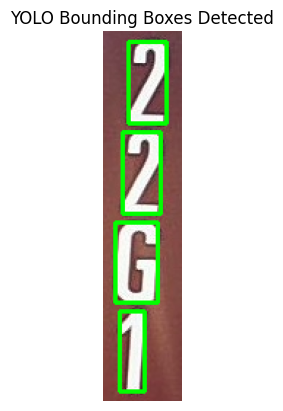

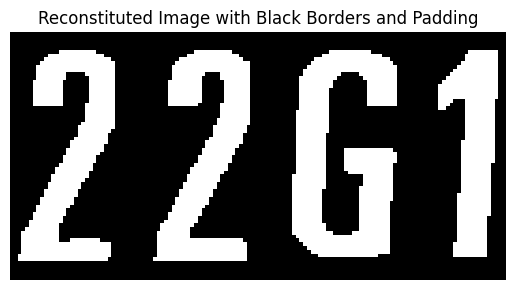

Reconstituted image saved as 'labeled_samples\144241001\1-144241001-OCR-LB-C02\1-144241001-OCR-LB-C02_reconst_1_class1.jpg'
Saved: labeled_samples\144241001\1-144241001-OCR-LB-C02\1-144241001-OCR-LB-C02_reconst_1_class1.jpg
Mean value of the binary image: 125.62238805970149

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\144241001\1-144241001-OCR-LF-C01\1-144241001-OCR-LF-C01_crop_0_class1.jpg: 192x640 4 0s, 82.4ms
Speed: 1.7ms preprocess, 82.4ms inference, 1.6ms postprocess per image at shape (1, 3, 192, 640)


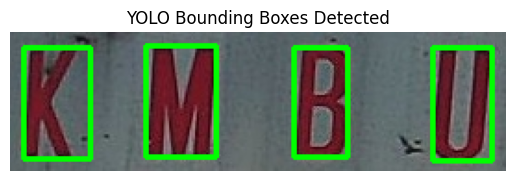

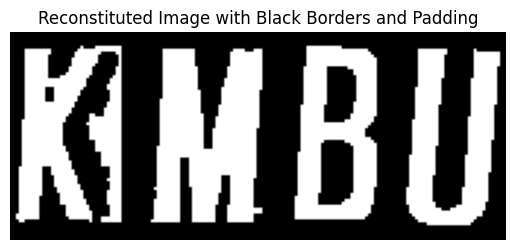

Reconstituted image saved as 'labeled_samples\144241001\1-144241001-OCR-LF-C01\1-144241001-OCR-LF-C01_reconst_0_class1.jpg'
Saved: labeled_samples\144241001\1-144241001-OCR-LF-C01\1-144241001-OCR-LF-C01_reconst_0_class1.jpg
Mean value of the binary image: 123.3450261079127

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\144241001\1-144241001-OCR-LF-C01\1-144241001-OCR-LF-C01_crop_1_class-1.jpg: 128x640 7 0s, 45.9ms
Speed: 1.2ms preprocess, 45.9ms inference, 1.4ms postprocess per image at shape (1, 3, 128, 640)


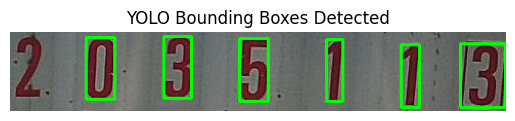

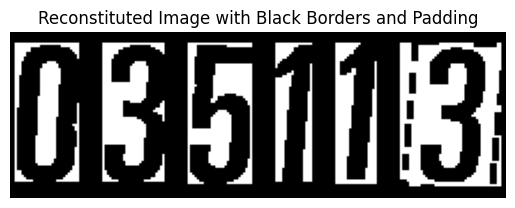

Reconstituted image saved as 'labeled_samples\144241001\1-144241001-OCR-LF-C01\1-144241001-OCR-LF-C01_reconst_1_class-1.jpg'
Saved: labeled_samples\144241001\1-144241001-OCR-LF-C01\1-144241001-OCR-LF-C01_reconst_1_class-1.jpg
Mean value of the binary image: 125.57138416908413

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\144241001\1-144241001-OCR-LF-C01\1-144241001-OCR-LF-C01_crop_2_class1.jpg: 192x640 4 0s, 74.1ms
Speed: 1.6ms preprocess, 74.1ms inference, 2.1ms postprocess per image at shape (1, 3, 192, 640)


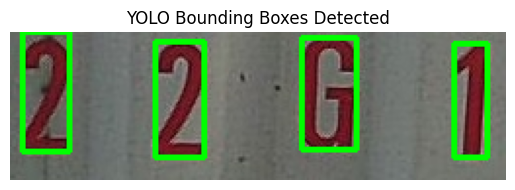

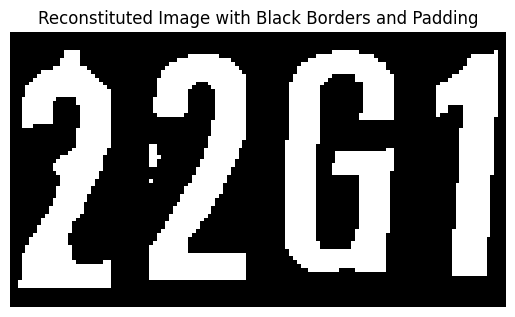

Reconstituted image saved as 'labeled_samples\144241001\1-144241001-OCR-LF-C01\1-144241001-OCR-LF-C01_reconst_2_class1.jpg'
Saved: labeled_samples\144241001\1-144241001-OCR-LF-C01\1-144241001-OCR-LF-C01_reconst_2_class1.jpg
Mean value of the binary image: 133.6881005173688

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\144241001\1-144241001-OCR-RF-D01\1-144241001-OCR-RF-D01_crop_0_class1.jpg: 192x640 4 0s, 65.5ms
Speed: 1.5ms preprocess, 65.5ms inference, 1.4ms postprocess per image at shape (1, 3, 192, 640)


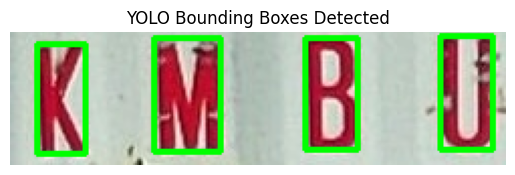

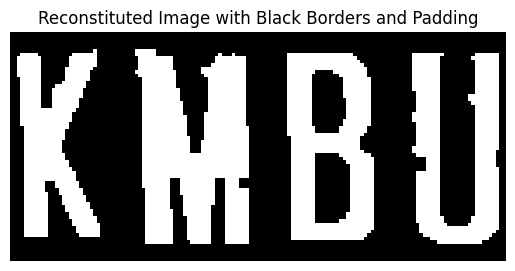

Reconstituted image saved as 'labeled_samples\144241001\1-144241001-OCR-RF-D01\1-144241001-OCR-RF-D01_reconst_0_class1.jpg'
Saved: labeled_samples\144241001\1-144241001-OCR-RF-D01\1-144241001-OCR-RF-D01_reconst_0_class1.jpg
Mean value of the binary image: 135.37520475020474

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\144241001\1-144241001-OCR-RF-D01\1-144241001-OCR-RF-D01_crop_1_class-1.jpg: 96x640 7 0s, 54.6ms
Speed: 1.5ms preprocess, 54.6ms inference, 1.3ms postprocess per image at shape (1, 3, 96, 640)


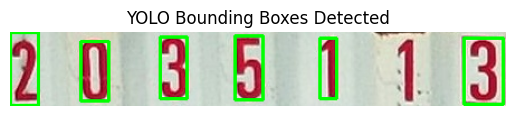

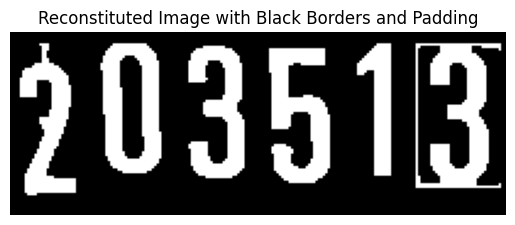

Reconstituted image saved as 'labeled_samples\144241001\1-144241001-OCR-RF-D01\1-144241001-OCR-RF-D01_reconst_1_class-1.jpg'
Saved: labeled_samples\144241001\1-144241001-OCR-RF-D01\1-144241001-OCR-RF-D01_reconst_1_class-1.jpg
Mean value of the binary image: 143.33697620683196

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\144241001\1-144241001-OCR-RF-D01\1-144241001-OCR-RF-D01_crop_2_class1.jpg: 192x640 4 0s, 98.9ms
Speed: 1.9ms preprocess, 98.9ms inference, 1.5ms postprocess per image at shape (1, 3, 192, 640)


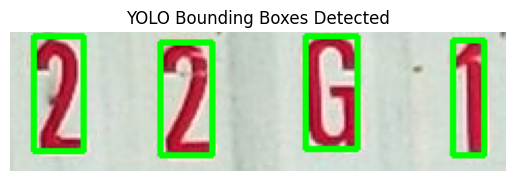

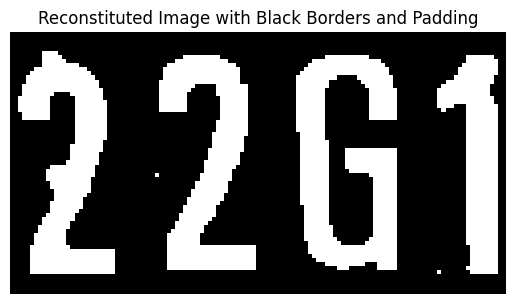

Reconstituted image saved as 'labeled_samples\144241001\1-144241001-OCR-RF-D01\1-144241001-OCR-RF-D01_reconst_2_class1.jpg'
Saved: labeled_samples\144241001\1-144241001-OCR-RF-D01\1-144241001-OCR-RF-D01_reconst_2_class1.jpg
Mean value of the binary image: 137.68278965129358

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\145327001\1-145327001-OCR-AH-A01\1-145327001-OCR-AH-A01_crop_0_class0.jpg: 96x640 12 0s, 64.0ms
Speed: 1.4ms preprocess, 64.0ms inference, 1.5ms postprocess per image at shape (1, 3, 96, 640)


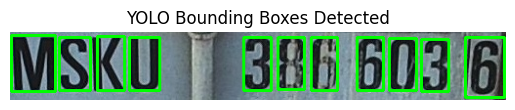

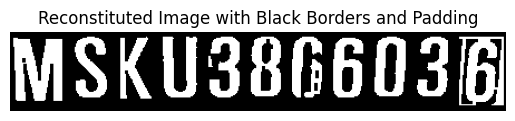

Reconstituted image saved as 'labeled_samples\145327001\1-145327001-OCR-AH-A01\1-145327001-OCR-AH-A01_reconst_0_class0.jpg'
Saved: labeled_samples\145327001\1-145327001-OCR-AH-A01\1-145327001-OCR-AH-A01_reconst_0_class0.jpg
Mean value of the binary image: 160.8984375

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\145327001\1-145327001-OCR-AH-A01\1-145327001-OCR-AH-A01_crop_1_class1.jpg: 320x640 4 0s, 103.9ms
Speed: 2.6ms preprocess, 103.9ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 640)


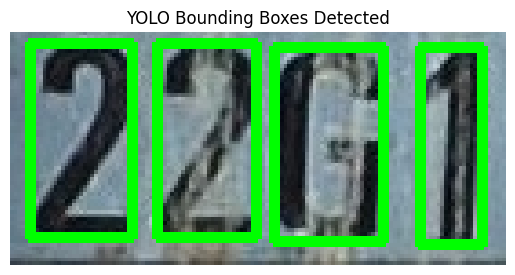

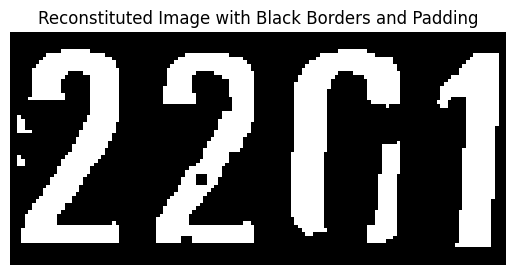

Reconstituted image saved as 'labeled_samples\145327001\1-145327001-OCR-AH-A01\1-145327001-OCR-AH-A01_reconst_1_class1.jpg'
Saved: labeled_samples\145327001\1-145327001-OCR-AH-A01\1-145327001-OCR-AH-A01_reconst_1_class1.jpg
Mean value of the binary image: 126.68251527097864

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\145327001\1-145327001-OCR-AS-B01\1-145327001-OCR-AS-B01_crop_0_class0.jpg: 96x640 13 0s, 48.2ms
Speed: 1.0ms preprocess, 48.2ms inference, 1.8ms postprocess per image at shape (1, 3, 96, 640)


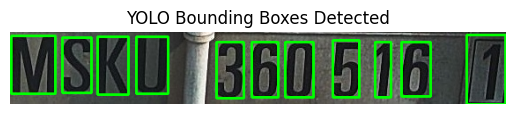

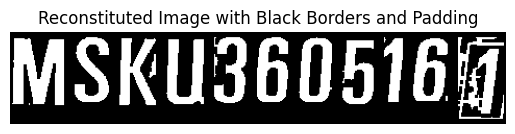

Reconstituted image saved as 'labeled_samples\145327001\1-145327001-OCR-AS-B01\1-145327001-OCR-AS-B01_reconst_0_class0.jpg'
Saved: labeled_samples\145327001\1-145327001-OCR-AS-B01\1-145327001-OCR-AS-B01_reconst_0_class0.jpg
Mean value of the binary image: 132.1861471861472

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\145327001\1-145327001-OCR-AS-B01\1-145327001-OCR-AS-B01_crop_1_class1.jpg: 352x640 4 0s, 120.4ms
Speed: 3.2ms preprocess, 120.4ms inference, 1.7ms postprocess per image at shape (1, 3, 352, 640)


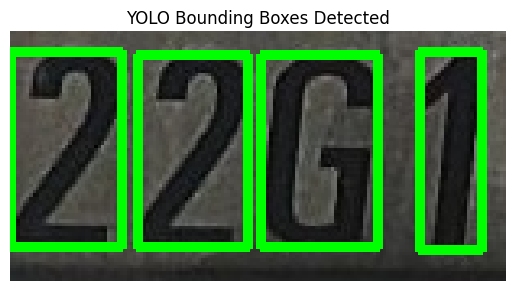

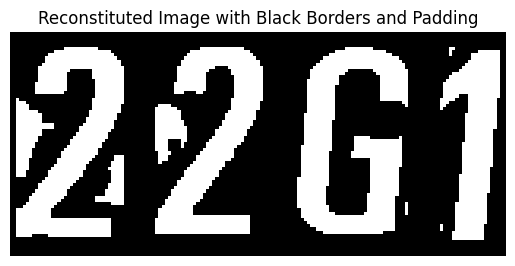

Reconstituted image saved as 'labeled_samples\145327001\1-145327001-OCR-AS-B01\1-145327001-OCR-AS-B01_reconst_1_class1.jpg'
Saved: labeled_samples\145327001\1-145327001-OCR-AS-B01\1-145327001-OCR-AS-B01_reconst_1_class1.jpg
Mean value of the binary image: 141.1897179253867

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\145327001\1-145327001-OCR-LB-C02\1-145327001-OCR-LB-C02_crop_0_class1.jpg: 288x640 4 0s, 90.1ms
Speed: 2.0ms preprocess, 90.1ms inference, 1.6ms postprocess per image at shape (1, 3, 288, 640)


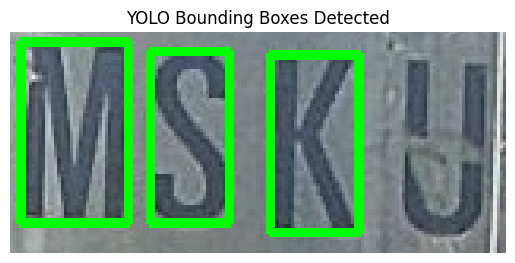

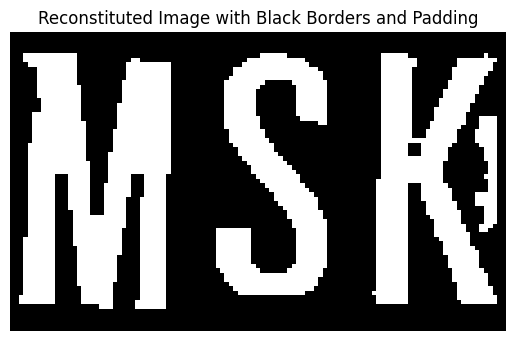

Reconstituted image saved as 'labeled_samples\145327001\1-145327001-OCR-LB-C02\1-145327001-OCR-LB-C02_reconst_0_class1.jpg'
Saved: labeled_samples\145327001\1-145327001-OCR-LB-C02\1-145327001-OCR-LB-C02_reconst_0_class1.jpg
Mean value of the binary image: 137.47298503023694

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\145327001\1-145327001-OCR-LB-C02\1-145327001-OCR-LB-C02_crop_1_class-1.jpg: 192x640 8 0s, 71.9ms
Speed: 1.5ms preprocess, 71.9ms inference, 1.6ms postprocess per image at shape (1, 3, 192, 640)


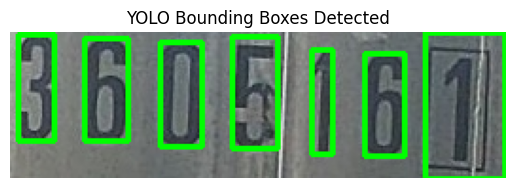

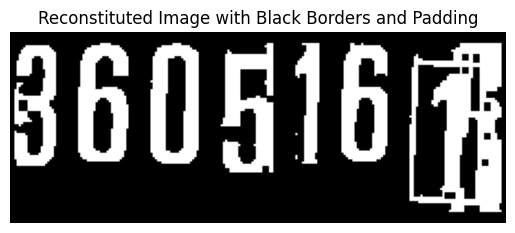

Reconstituted image saved as 'labeled_samples\145327001\1-145327001-OCR-LB-C02\1-145327001-OCR-LB-C02_reconst_1_class-1.jpg'
Saved: labeled_samples\145327001\1-145327001-OCR-LB-C02\1-145327001-OCR-LB-C02_reconst_1_class-1.jpg
Mean value of the binary image: 133.81370192307693

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\145327001\1-145327001-OCR-LB-C02\1-145327001-OCR-LB-C02_crop_2_class1.jpg: 320x640 4 0s, 104.7ms
Speed: 2.4ms preprocess, 104.7ms inference, 1.7ms postprocess per image at shape (1, 3, 320, 640)


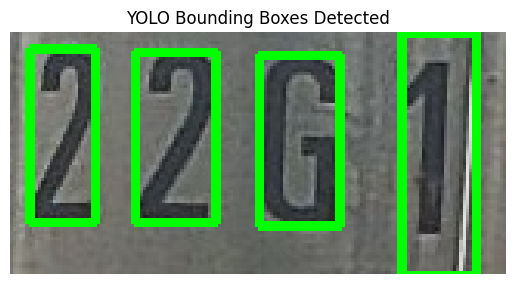

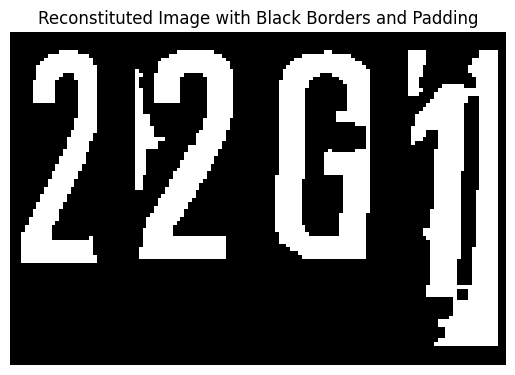

Reconstituted image saved as 'labeled_samples\145327001\1-145327001-OCR-LB-C02\1-145327001-OCR-LB-C02_reconst_2_class1.jpg'
Saved: labeled_samples\145327001\1-145327001-OCR-LB-C02\1-145327001-OCR-LB-C02_reconst_2_class1.jpg
Mean value of the binary image: 128.9320652173913

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\145327001\1-145327001-OCR-LF-C01\1-145327001-OCR-LF-C01_crop_0_class1.jpg: 288x640 4 0s, 75.8ms
Speed: 2.4ms preprocess, 75.8ms inference, 1.2ms postprocess per image at shape (1, 3, 288, 640)


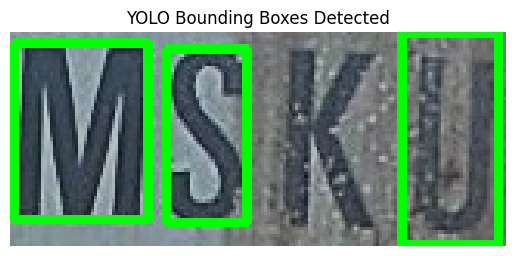

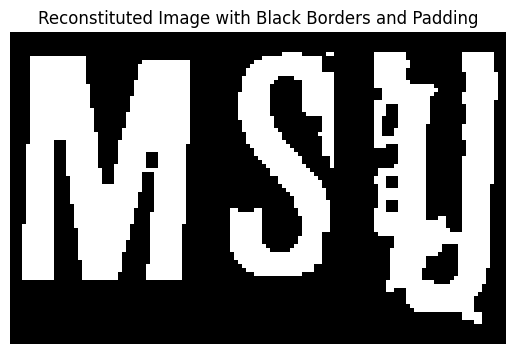

Reconstituted image saved as 'labeled_samples\145327001\1-145327001-OCR-LF-C01\1-145327001-OCR-LF-C01_reconst_0_class1.jpg'
Saved: labeled_samples\145327001\1-145327001-OCR-LF-C01\1-145327001-OCR-LF-C01_reconst_0_class1.jpg
Mean value of the binary image: 128.2248399487836

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\145327001\1-145327001-OCR-LF-C01\1-145327001-OCR-LF-C01_crop_1_class-1.jpg: 192x640 7 0s, 69.5ms
Speed: 1.6ms preprocess, 69.5ms inference, 1.3ms postprocess per image at shape (1, 3, 192, 640)


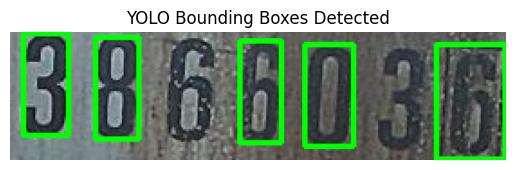

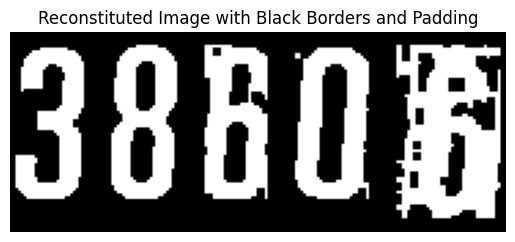

Reconstituted image saved as 'labeled_samples\145327001\1-145327001-OCR-LF-C01\1-145327001-OCR-LF-C01_reconst_1_class-1.jpg'
Saved: labeled_samples\145327001\1-145327001-OCR-LF-C01\1-145327001-OCR-LF-C01_reconst_1_class-1.jpg
Mean value of the binary image: 139.15395823215152

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\145327001\1-145327001-OCR-LF-C01\1-145327001-OCR-LF-C01_crop_2_class1.jpg: 320x640 4 0s, 115.9ms
Speed: 3.0ms preprocess, 115.9ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 640)


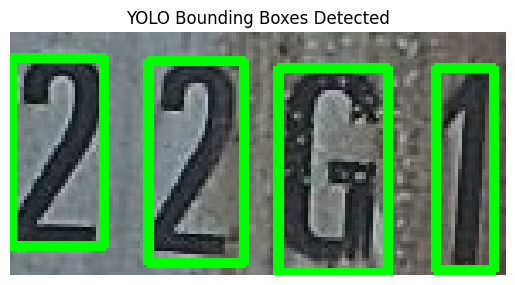

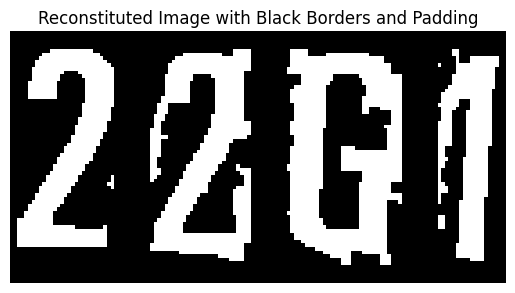

Reconstituted image saved as 'labeled_samples\145327001\1-145327001-OCR-LF-C01\1-145327001-OCR-LF-C01_reconst_2_class1.jpg'
Saved: labeled_samples\145327001\1-145327001-OCR-LF-C01\1-145327001-OCR-LF-C01_reconst_2_class1.jpg
Mean value of the binary image: 151.36440360090023

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\145327001\1-145327001-OCR-RF-D01\1-145327001-OCR-RF-D01_crop_0_class1.jpg: 256x640 4 0s, 86.1ms
Speed: 1.5ms preprocess, 86.1ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 640)


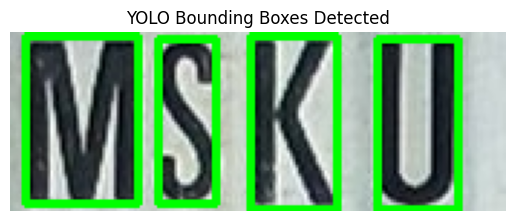

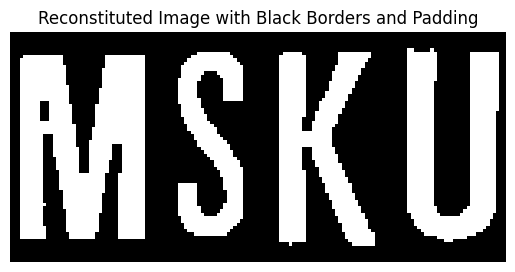

Reconstituted image saved as 'labeled_samples\145327001\1-145327001-OCR-RF-D01\1-145327001-OCR-RF-D01_reconst_0_class1.jpg'
Saved: labeled_samples\145327001\1-145327001-OCR-RF-D01\1-145327001-OCR-RF-D01_reconst_0_class1.jpg
Mean value of the binary image: 159.8779317697228

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\145327001\1-145327001-OCR-RF-D01\1-145327001-OCR-RF-D01_crop_1_class-1.jpg: 160x640 7 0s, 55.9ms
Speed: 1.1ms preprocess, 55.9ms inference, 1.4ms postprocess per image at shape (1, 3, 160, 640)


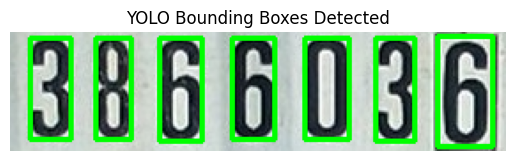

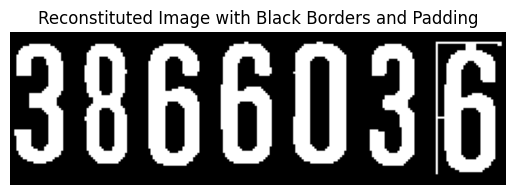

Reconstituted image saved as 'labeled_samples\145327001\1-145327001-OCR-RF-D01\1-145327001-OCR-RF-D01_reconst_1_class-1.jpg'
Saved: labeled_samples\145327001\1-145327001-OCR-RF-D01\1-145327001-OCR-RF-D01_reconst_1_class-1.jpg
Mean value of the binary image: 167.25340136054422

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\145327001\1-145327001-OCR-RF-D01\1-145327001-OCR-RF-D01_crop_2_class1.jpg: 320x640 4 0s, 103.4ms
Speed: 2.4ms preprocess, 103.4ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 640)


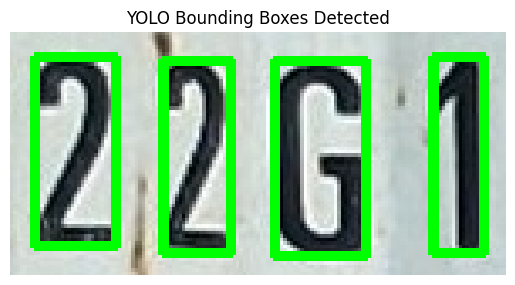

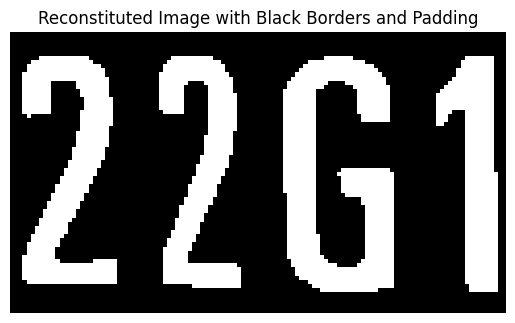

Reconstituted image saved as 'labeled_samples\145327001\1-145327001-OCR-RF-D01\1-145327001-OCR-RF-D01_reconst_2_class1.jpg'
Saved: labeled_samples\145327001\1-145327001-OCR-RF-D01\1-145327001-OCR-RF-D01_reconst_2_class1.jpg
Mean value of the binary image: 63.52647530754145

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\150224001\1-150224001-OCR-AH-A01\1-150224001-OCR-AH-A01_crop_0_class0.jpg: 96x640 12 0s, 45.8ms
Speed: 1.1ms preprocess, 45.8ms inference, 1.2ms postprocess per image at shape (1, 3, 96, 640)


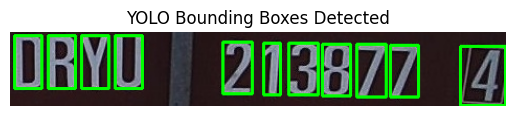

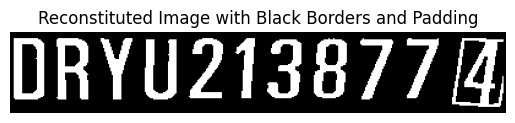

Reconstituted image saved as 'labeled_samples\150224001\1-150224001-OCR-AH-A01\1-150224001-OCR-AH-A01_reconst_0_class0.jpg'
Saved: labeled_samples\150224001\1-150224001-OCR-AH-A01\1-150224001-OCR-AH-A01_reconst_0_class0.jpg
Mean value of the binary image: 79.53412073490814

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\150224001\1-150224001-OCR-AH-A01\1-150224001-OCR-AH-A01_crop_1_class1.jpg: 288x640 4 0s, 97.9ms
Speed: 2.1ms preprocess, 97.9ms inference, 1.3ms postprocess per image at shape (1, 3, 288, 640)


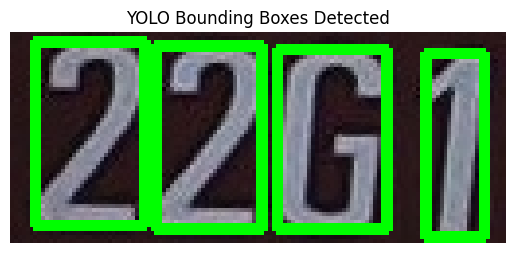

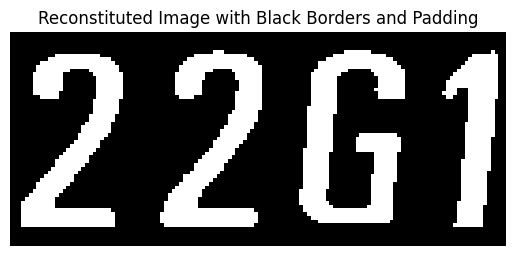

Reconstituted image saved as 'labeled_samples\150224001\1-150224001-OCR-AH-A01\1-150224001-OCR-AH-A01_reconst_1_class1.jpg'
Saved: labeled_samples\150224001\1-150224001-OCR-AH-A01\1-150224001-OCR-AH-A01_reconst_1_class1.jpg
Mean value of the binary image: 97.27967806841046

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\150224001\1-150224001-OCR-AS-B01\1-150224001-OCR-AS-B01_crop_0_class0.jpg: 96x640 12 0s, 40.8ms
Speed: 0.8ms preprocess, 40.8ms inference, 1.3ms postprocess per image at shape (1, 3, 96, 640)


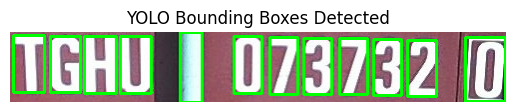

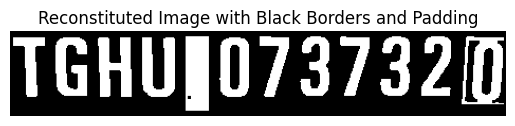

Reconstituted image saved as 'labeled_samples\150224001\1-150224001-OCR-AS-B01\1-150224001-OCR-AS-B01_reconst_0_class0.jpg'
Saved: labeled_samples\150224001\1-150224001-OCR-AS-B01\1-150224001-OCR-AS-B01_reconst_0_class0.jpg
Mean value of the binary image: 98.994140625

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\150224001\1-150224001-OCR-AS-B01\1-150224001-OCR-AS-B01_crop_1_class1.jpg: 320x640 4 0s, 123.2ms
Speed: 2.1ms preprocess, 123.2ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 640)


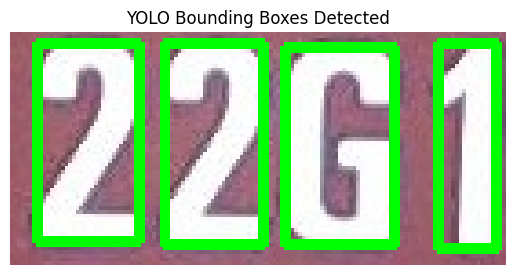

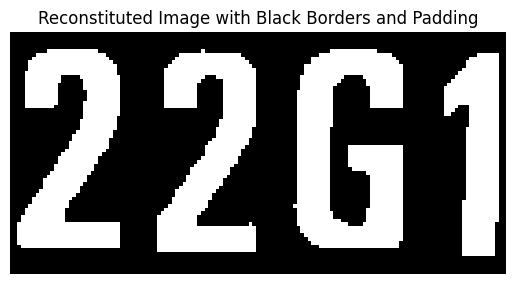

Reconstituted image saved as 'labeled_samples\150224001\1-150224001-OCR-AS-B01\1-150224001-OCR-AS-B01_reconst_1_class1.jpg'
Saved: labeled_samples\150224001\1-150224001-OCR-AS-B01\1-150224001-OCR-AS-B01_reconst_1_class1.jpg
Mean value of the binary image: 66.33263289413902

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\150224001\1-150224001-OCR-LB-C02\1-150224001-OCR-LB-C02_crop_0_class0.jpg: 640x64 11 0s, 43.7ms
Speed: 1.0ms preprocess, 43.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 64)


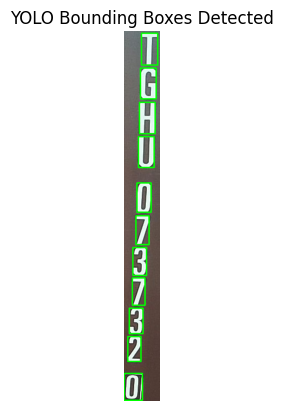

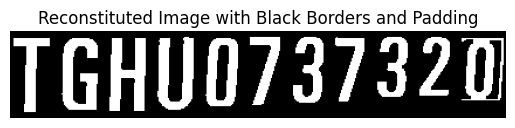

Reconstituted image saved as 'labeled_samples\150224001\1-150224001-OCR-LB-C02\1-150224001-OCR-LB-C02_reconst_0_class0.jpg'
Saved: labeled_samples\150224001\1-150224001-OCR-LB-C02\1-150224001-OCR-LB-C02_reconst_0_class0.jpg
Mean value of the binary image: 66.10590182018754

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\150224001\1-150224001-OCR-LB-C02\1-150224001-OCR-LB-C02_crop_1_class1.jpg: 640x160 4 0s, 51.6ms
Speed: 1.7ms preprocess, 51.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 160)


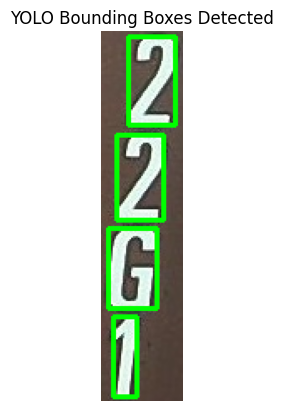

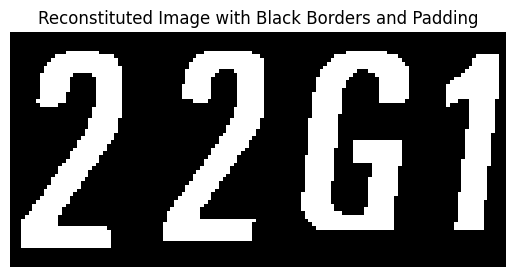

Reconstituted image saved as 'labeled_samples\150224001\1-150224001-OCR-LB-C02\1-150224001-OCR-LB-C02_reconst_1_class1.jpg'
Saved: labeled_samples\150224001\1-150224001-OCR-LB-C02\1-150224001-OCR-LB-C02_reconst_1_class1.jpg
Mean value of the binary image: 58.88927097661623

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\150224001\1-150224001-OCR-LF-C01\1-150224001-OCR-LF-C01_crop_0_class0.jpg: 640x96 13 0s, 46.7ms
Speed: 1.7ms preprocess, 46.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 96)


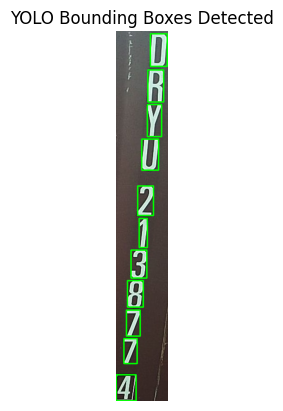

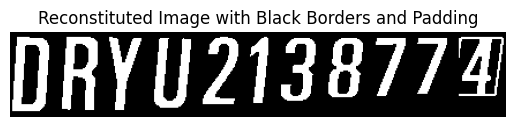

Reconstituted image saved as 'labeled_samples\150224001\1-150224001-OCR-LF-C01\1-150224001-OCR-LF-C01_reconst_0_class0.jpg'
Saved: labeled_samples\150224001\1-150224001-OCR-LF-C01\1-150224001-OCR-LF-C01_reconst_0_class0.jpg
Mean value of the binary image: 70.74588477366255

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\150224001\1-150224001-OCR-LF-C01\1-150224001-OCR-LF-C01_crop_1_class1.jpg: 640x128 4 0s, 70.5ms
Speed: 1.1ms preprocess, 70.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 128)


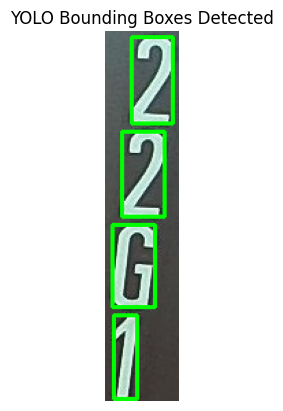

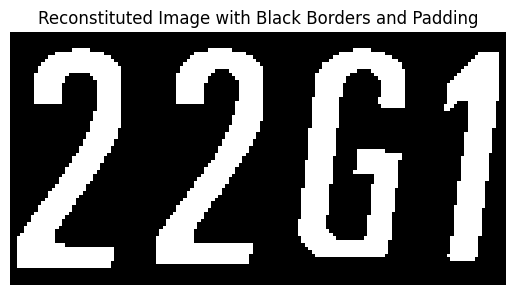

Reconstituted image saved as 'labeled_samples\150224001\1-150224001-OCR-LF-C01\1-150224001-OCR-LF-C01_reconst_1_class1.jpg'
Saved: labeled_samples\150224001\1-150224001-OCR-LF-C01\1-150224001-OCR-LF-C01_reconst_1_class1.jpg
Mean value of the binary image: 81.6

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\150224001\1-150224001-OCR-RF-D01\1-150224001-OCR-RF-D01_crop_0_class0.jpg: 640x64 11 0s, 44.2ms
Speed: 0.7ms preprocess, 44.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 64)


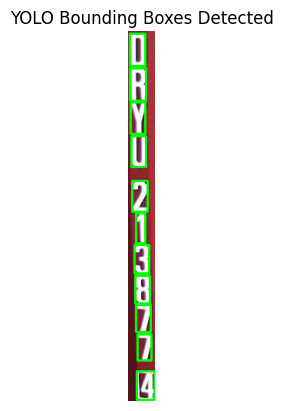

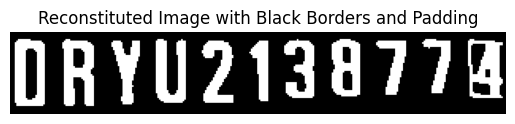

Reconstituted image saved as 'labeled_samples\150224001\1-150224001-OCR-RF-D01\1-150224001-OCR-RF-D01_reconst_0_class0.jpg'
Saved: labeled_samples\150224001\1-150224001-OCR-RF-D01\1-150224001-OCR-RF-D01_reconst_0_class0.jpg
Mean value of the binary image: 92.63988095238095

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\150224001\1-150224001-OCR-RF-D01\1-150224001-OCR-RF-D01_crop_1_class1.jpg: 640x128 4 0s, 59.8ms
Speed: 1.4ms preprocess, 59.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 128)


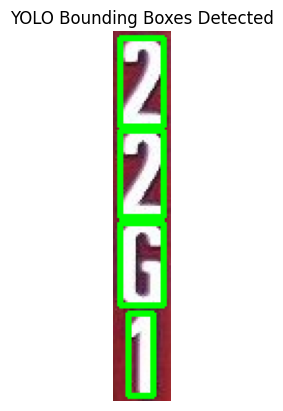

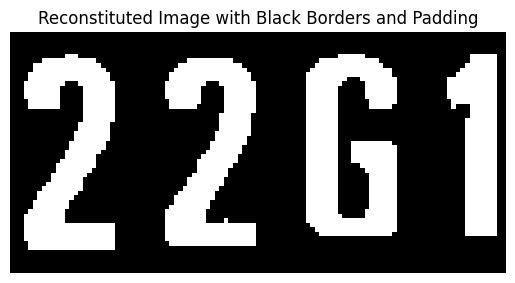

Reconstituted image saved as 'labeled_samples\150224001\1-150224001-OCR-RF-D01\1-150224001-OCR-RF-D01_reconst_1_class1.jpg'
Saved: labeled_samples\150224001\1-150224001-OCR-RF-D01\1-150224001-OCR-RF-D01_reconst_1_class1.jpg
Mean value of the binary image: 68.08381779380382

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\152733001\1-152733001-OCR-AH-A01\1-152733001-OCR-AH-A01_crop_0_class0.jpg: 640x128 11 0s, 84.3ms
Speed: 1.7ms preprocess, 84.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 128)


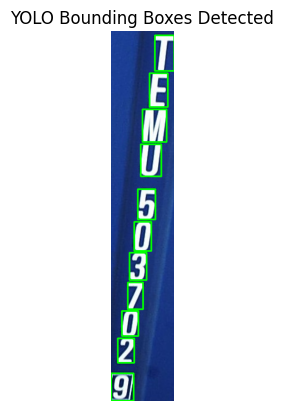

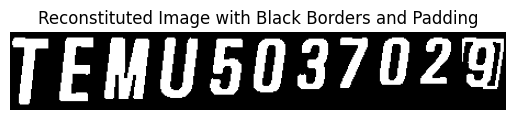

Reconstituted image saved as 'labeled_samples\152733001\1-152733001-OCR-AH-A01\1-152733001-OCR-AH-A01_reconst_0_class0.jpg'
Saved: labeled_samples\152733001\1-152733001-OCR-AH-A01\1-152733001-OCR-AH-A01_reconst_0_class0.jpg
Mean value of the binary image: 97.75770206596593

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\152733001\1-152733001-OCR-AS-B01\1-152733001-OCR-AS-B01_crop_0_class0.jpg: 96x640 12 0s, 47.6ms
Speed: 0.8ms preprocess, 47.6ms inference, 1.5ms postprocess per image at shape (1, 3, 96, 640)


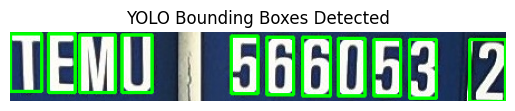

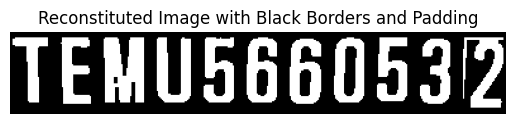

Reconstituted image saved as 'labeled_samples\152733001\1-152733001-OCR-AS-B01\1-152733001-OCR-AS-B01_reconst_0_class0.jpg'
Saved: labeled_samples\152733001\1-152733001-OCR-AS-B01\1-152733001-OCR-AS-B01_reconst_0_class0.jpg
Mean value of the binary image: 94.92227247032221

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\152733001\1-152733001-OCR-AS-B01\1-152733001-OCR-AS-B01_crop_1_class1.jpg: 320x640 4 0s, 101.2ms
Speed: 3.5ms preprocess, 101.2ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 640)


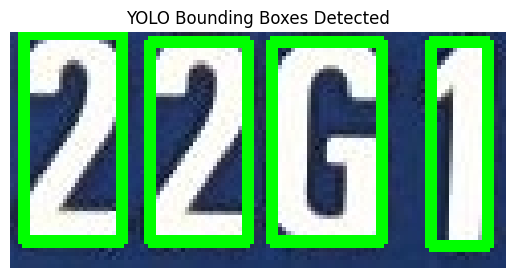

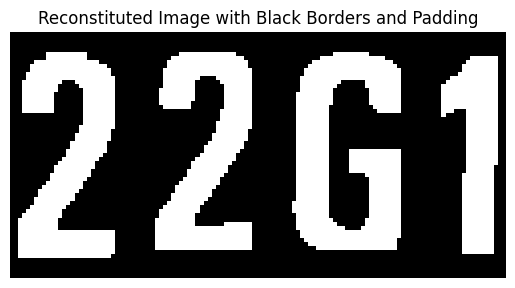

Reconstituted image saved as 'labeled_samples\152733001\1-152733001-OCR-AS-B01\1-152733001-OCR-AS-B01_reconst_1_class1.jpg'
Saved: labeled_samples\152733001\1-152733001-OCR-AS-B01\1-152733001-OCR-AS-B01_reconst_1_class1.jpg
Mean value of the binary image: 70.00685693106004

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\152733001\1-152733001-OCR-LB-C02\1-152733001-OCR-LB-C02_crop_0_class0.jpg: 640x96 11 0s, 44.0ms
Speed: 1.0ms preprocess, 44.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 96)


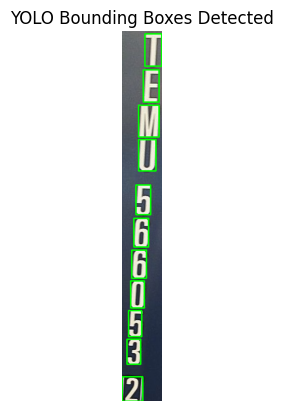

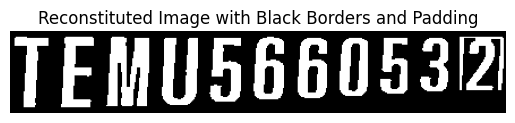

Reconstituted image saved as 'labeled_samples\152733001\1-152733001-OCR-LB-C02\1-152733001-OCR-LB-C02_reconst_0_class0.jpg'
Saved: labeled_samples\152733001\1-152733001-OCR-LB-C02\1-152733001-OCR-LB-C02_reconst_0_class0.jpg
Mean value of the binary image: 71.72489804915683

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\152733001\1-152733001-OCR-LB-C02\1-152733001-OCR-LB-C02_crop_1_class1.jpg: 640x160 4 0s, 65.2ms
Speed: 1.2ms preprocess, 65.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 160)


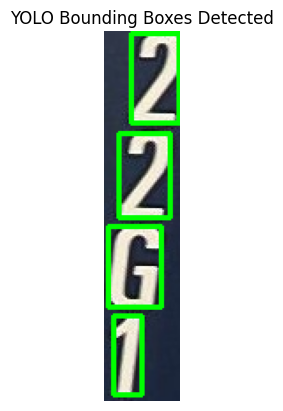

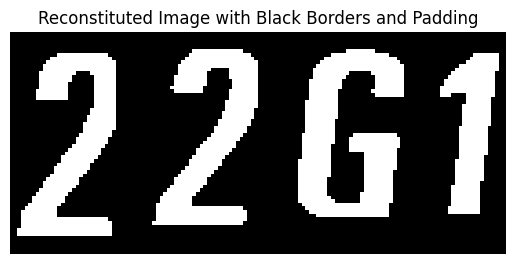

Reconstituted image saved as 'labeled_samples\152733001\1-152733001-OCR-LB-C02\1-152733001-OCR-LB-C02_reconst_1_class1.jpg'
Saved: labeled_samples\152733001\1-152733001-OCR-LB-C02\1-152733001-OCR-LB-C02_reconst_1_class1.jpg
Mean value of the binary image: 69.05662983425414

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\152733001\1-152733001-OCR-LF-C01\1-152733001-OCR-LF-C01_crop_0_class0.jpg: 640x96 11 0s, 45.2ms
Speed: 1.1ms preprocess, 45.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 96)


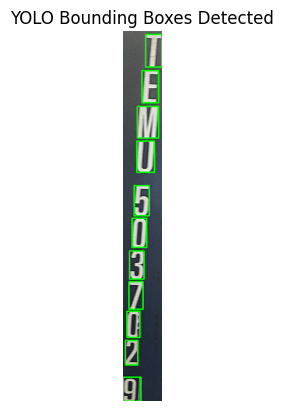

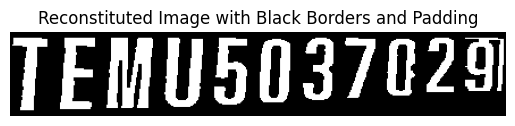

Reconstituted image saved as 'labeled_samples\152733001\1-152733001-OCR-LF-C01\1-152733001-OCR-LF-C01_reconst_0_class0.jpg'
Saved: labeled_samples\152733001\1-152733001-OCR-LF-C01\1-152733001-OCR-LF-C01_reconst_0_class0.jpg
Mean value of the binary image: 73.69266055045871

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\152733001\1-152733001-OCR-LF-C01\1-152733001-OCR-LF-C01_crop_1_class1.jpg: 640x128 4 0s, 55.5ms
Speed: 1.1ms preprocess, 55.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 128)


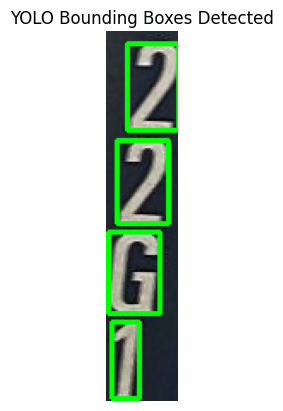

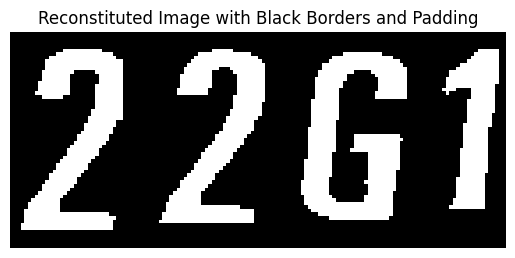

Reconstituted image saved as 'labeled_samples\152733001\1-152733001-OCR-LF-C01\1-152733001-OCR-LF-C01_reconst_1_class1.jpg'
Saved: labeled_samples\152733001\1-152733001-OCR-LF-C01\1-152733001-OCR-LF-C01_reconst_1_class1.jpg
Mean value of the binary image: 82.13752289699873

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\152733001\1-152733001-OCR-RF-D01\1-152733001-OCR-RF-D01_crop_0_class0.jpg: 640x64 11 0s, 33.9ms
Speed: 0.7ms preprocess, 33.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 64)


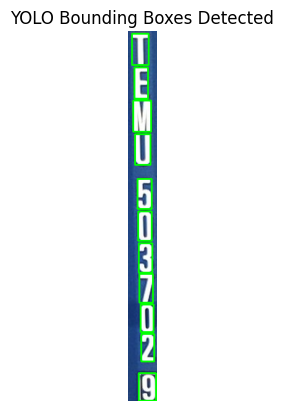

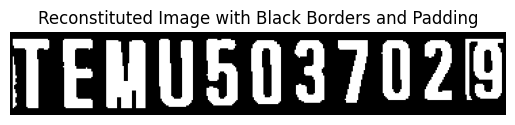

Reconstituted image saved as 'labeled_samples\152733001\1-152733001-OCR-RF-D01\1-152733001-OCR-RF-D01_reconst_0_class0.jpg'
Saved: labeled_samples\152733001\1-152733001-OCR-RF-D01\1-152733001-OCR-RF-D01_reconst_0_class0.jpg
Mean value of the binary image: 82.91836734693878

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\152733001\1-152733001-OCR-RF-D01\1-152733001-OCR-RF-D01_crop_1_class1.jpg: 640x128 4 0s, 74.3ms
Speed: 1.4ms preprocess, 74.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 128)


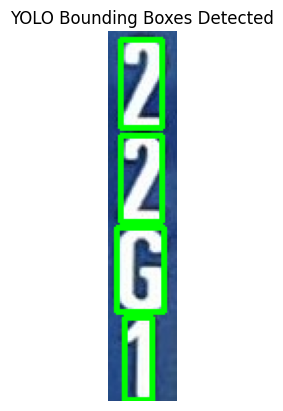

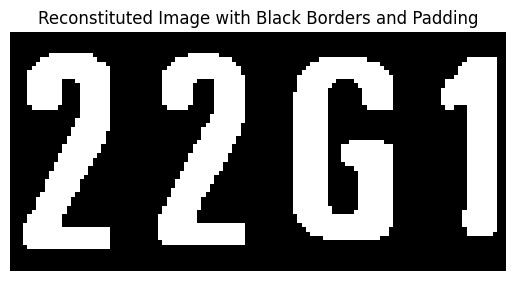

Reconstituted image saved as 'labeled_samples\152733001\1-152733001-OCR-RF-D01\1-152733001-OCR-RF-D01_reconst_1_class1.jpg'
Saved: labeled_samples\152733001\1-152733001-OCR-RF-D01\1-152733001-OCR-RF-D01_reconst_1_class1.jpg
Mean value of the binary image: 96.92234848484848

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\153458001\1-153458001-OCR-AH-A01\1-153458001-OCR-AH-A01_crop_0_class0.jpg: 128x640 12 0s, 49.0ms
Speed: 1.1ms preprocess, 49.0ms inference, 1.3ms postprocess per image at shape (1, 3, 128, 640)


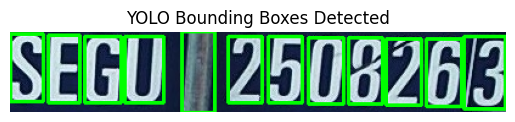

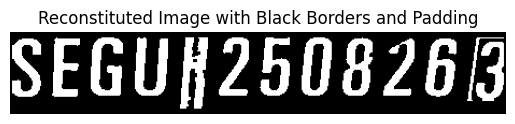

Reconstituted image saved as 'labeled_samples\153458001\1-153458001-OCR-AH-A01\1-153458001-OCR-AH-A01_reconst_0_class0.jpg'
Saved: labeled_samples\153458001\1-153458001-OCR-AH-A01\1-153458001-OCR-AH-A01_reconst_0_class0.jpg
Mean value of the binary image: 94.52586206896552

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\153458001\1-153458001-OCR-AH-A01\1-153458001-OCR-AH-A01_crop_1_class1.jpg: 320x640 4 0s, 105.0ms
Speed: 2.8ms preprocess, 105.0ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 640)


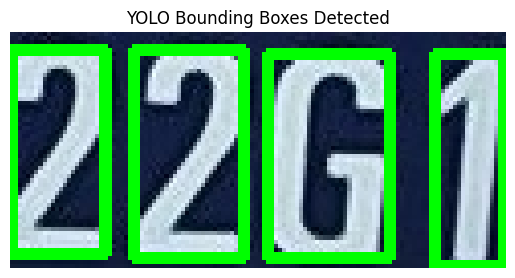

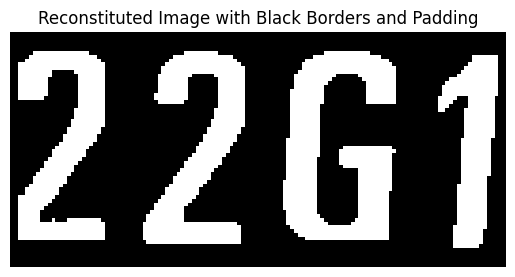

Reconstituted image saved as 'labeled_samples\153458001\1-153458001-OCR-AH-A01\1-153458001-OCR-AH-A01_reconst_1_class1.jpg'
Saved: labeled_samples\153458001\1-153458001-OCR-AH-A01\1-153458001-OCR-AH-A01_reconst_1_class1.jpg
Mean value of the binary image: 94.54780618843895

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\153458001\1-153458001-OCR-AS-B01\1-153458001-OCR-AS-B01_crop_0_class0.jpg: 128x640 12 0s, 75.3ms
Speed: 2.6ms preprocess, 75.3ms inference, 1.3ms postprocess per image at shape (1, 3, 128, 640)


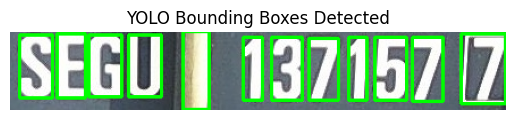

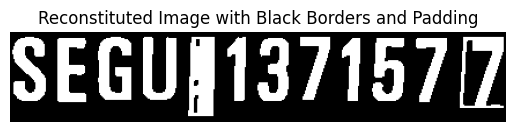

Reconstituted image saved as 'labeled_samples\153458001\1-153458001-OCR-AS-B01\1-153458001-OCR-AS-B01_reconst_0_class0.jpg'
Saved: labeled_samples\153458001\1-153458001-OCR-AS-B01\1-153458001-OCR-AS-B01_reconst_0_class0.jpg
Mean value of the binary image: 95.28643036161833

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\153458001\1-153458001-OCR-AS-B01\1-153458001-OCR-AS-B01_crop_1_class1.jpg: 320x640 4 0s, 91.3ms
Speed: 2.0ms preprocess, 91.3ms inference, 1.7ms postprocess per image at shape (1, 3, 320, 640)


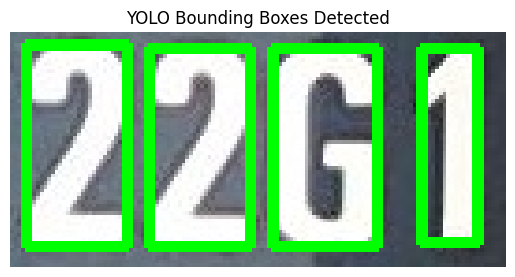

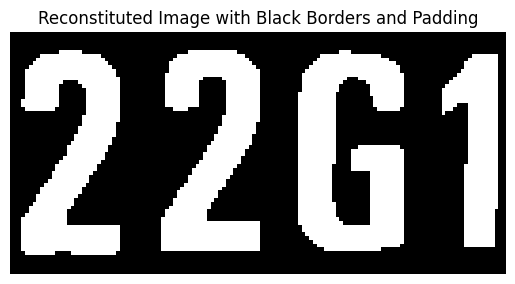

Reconstituted image saved as 'labeled_samples\153458001\1-153458001-OCR-AS-B01\1-153458001-OCR-AS-B01_reconst_1_class1.jpg'
Saved: labeled_samples\153458001\1-153458001-OCR-AS-B01\1-153458001-OCR-AS-B01_reconst_1_class1.jpg
Mean value of the binary image: 70.79870046320123

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\153458001\1-153458001-OCR-LB-C02\1-153458001-OCR-LB-C02_crop_0_class0.jpg: 640x64 11 0s, 34.3ms
Speed: 1.0ms preprocess, 34.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 64)


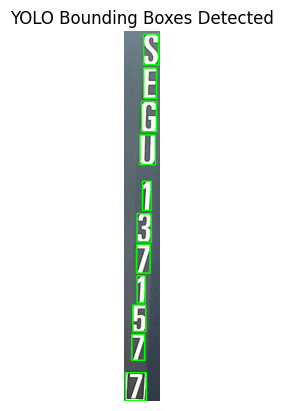

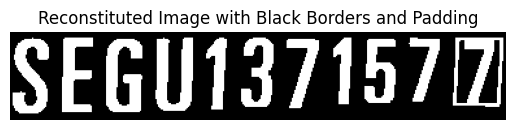

Reconstituted image saved as 'labeled_samples\153458001\1-153458001-OCR-LB-C02\1-153458001-OCR-LB-C02_reconst_0_class0.jpg'
Saved: labeled_samples\153458001\1-153458001-OCR-LB-C02\1-153458001-OCR-LB-C02_reconst_0_class0.jpg
Mean value of the binary image: 82.87303058387396

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\153458001\1-153458001-OCR-LB-C02\1-153458001-OCR-LB-C02_crop_1_class1.jpg: 640x160 4 0s, 65.6ms
Speed: 1.2ms preprocess, 65.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 160)


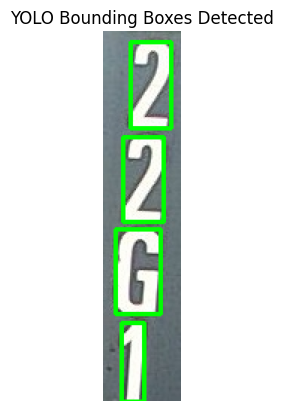

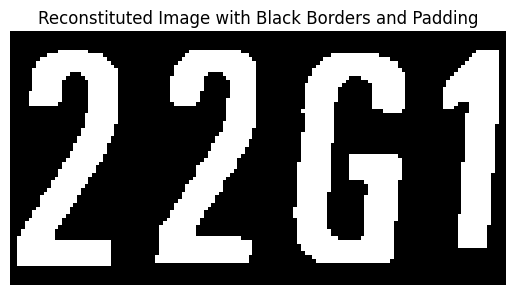

Reconstituted image saved as 'labeled_samples\153458001\1-153458001-OCR-LB-C02\1-153458001-OCR-LB-C02_reconst_1_class1.jpg'
Saved: labeled_samples\153458001\1-153458001-OCR-LB-C02\1-153458001-OCR-LB-C02_reconst_1_class1.jpg
Mean value of the binary image: 68.04346643455554

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\153458001\1-153458001-OCR-LF-C01\1-153458001-OCR-LF-C01_crop_0_class0.jpg: 640x96 11 0s, 53.9ms
Speed: 1.4ms preprocess, 53.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 96)


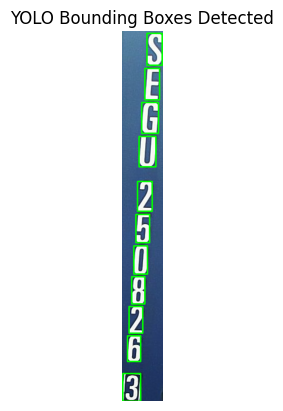

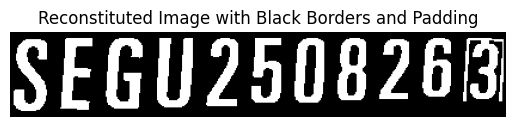

Reconstituted image saved as 'labeled_samples\153458001\1-153458001-OCR-LF-C01\1-153458001-OCR-LF-C01_reconst_0_class0.jpg'
Saved: labeled_samples\153458001\1-153458001-OCR-LF-C01\1-153458001-OCR-LF-C01_reconst_0_class0.jpg
Mean value of the binary image: 77.87231663685152

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\153458001\1-153458001-OCR-LF-C01\1-153458001-OCR-LF-C01_crop_1_class1.jpg: 640x160 4 0s, 86.8ms
Speed: 2.0ms preprocess, 86.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 160)


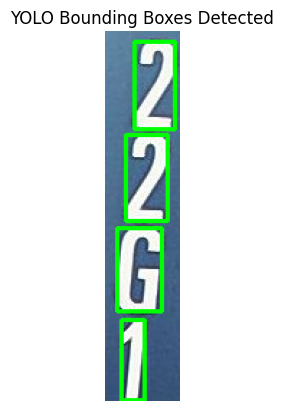

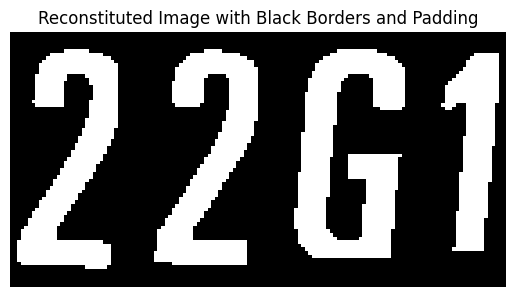

Reconstituted image saved as 'labeled_samples\153458001\1-153458001-OCR-LF-C01\1-153458001-OCR-LF-C01_reconst_1_class1.jpg'
Saved: labeled_samples\153458001\1-153458001-OCR-LF-C01\1-153458001-OCR-LF-C01_reconst_1_class1.jpg
Mean value of the binary image: 87.46776147050441

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\153458001\1-153458001-OCR-RF-D01\1-153458001-OCR-RF-D01_crop_0_class0.jpg: 640x64 11 0s, 60.4ms
Speed: 1.2ms preprocess, 60.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 64)


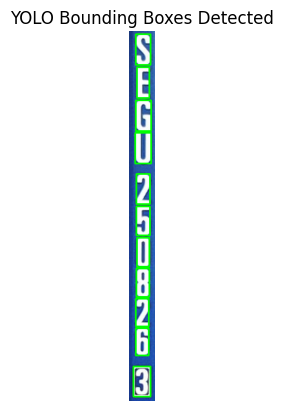

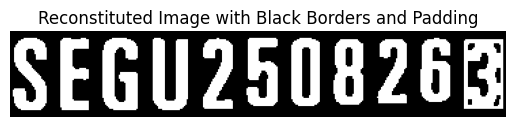

Reconstituted image saved as 'labeled_samples\153458001\1-153458001-OCR-RF-D01\1-153458001-OCR-RF-D01_reconst_0_class0.jpg'
Saved: labeled_samples\153458001\1-153458001-OCR-RF-D01\1-153458001-OCR-RF-D01_reconst_0_class0.jpg
Mean value of the binary image: 91.74860022396416

image 1/1 c:\Users\perso\Desktop\Stage\ContainerVision-Marsa_Maroc\notebook\labeled_samples\153458001\1-153458001-OCR-RF-D01\1-153458001-OCR-RF-D01_crop_1_class1.jpg: 640x128 4 0s, 523.4ms
Speed: 14.9ms preprocess, 523.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 128)


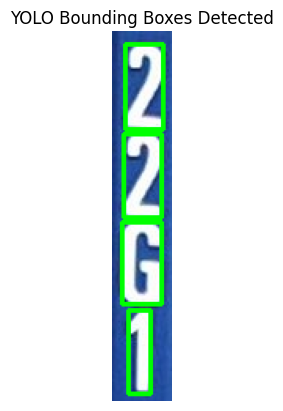

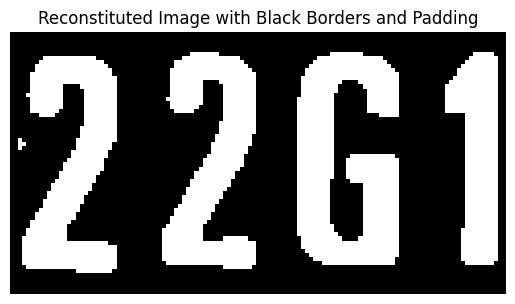

Reconstituted image saved as 'labeled_samples\153458001\1-153458001-OCR-RF-D01\1-153458001-OCR-RF-D01_reconst_1_class1.jpg'
Saved: labeled_samples\153458001\1-153458001-OCR-RF-D01\1-153458001-OCR-RF-D01_reconst_1_class1.jpg


In [18]:
import os
import cv2

def process_and_reconstitute_all(labeled_samples_dir="labeled_samples"):
    """
    For each id and each labeled image subfolder, reconstitute all crops and save the result.
    """
    for img_id in os.listdir(labeled_samples_dir):
        id_folder = os.path.join(labeled_samples_dir, img_id)
        if not os.path.isdir(id_folder):
            continue
        for labeled_image_subfolder in os.listdir(id_folder):
            subfolder_path = os.path.join(id_folder, labeled_image_subfolder)
            if not os.path.isdir(subfolder_path):
                continue
            # Collect all crop images in this subfolder
            crop_files = [f for f in os.listdir(subfolder_path) if f.lower().endswith(('.jpg', '.jpeg', '.png')) and '_crop_' in f]
            if not crop_files:
                continue
            # Sort crop files by index in filename for consistent order
            crop_files.sort(key=lambda x: int(x.split('_crop_')[1].split('_')[0]))
            # For each crop, apply adaptive threshold and get bounding rects
            for idx, crop_file in enumerate(crop_files):
                crop_path = os.path.join(subfolder_path, crop_file)
                # Use adaptive threshold and filter to get bounding boxes
                closingImage, boundRect = adaptive_threshold_and_filter(crop_path)
                # Reconstitute the character(s) in this crop
                if boundRect:
                    # Extract class id from filename
                    class_id = crop_file.split('class')[-1].split('.')[0]
                    save_name = f"{labeled_image_subfolder}_reconst_{idx}_class{class_id}.jpg"
                    save_path = os.path.join(subfolder_path, save_name)
                    reconstitute_characters_with_padding(closingImage, boundRect, save_path=save_path)
                    print(f"Saved: {save_path}")

# Run the process
process_and_reconstitute_all("labeled_samples")

In [ ]:
# Use pytesseract to extract text from the reconstituted images
import os
import pytesseract
import cv2

def extract_text_from_reconstituted_images(labeled_samples_dir="labeled_samples"):
    """
    Traverse all subfolders and extract text from reconstituted images using pytesseract.
    Prints the filename and the extracted text.
    """
    for img_id in os.listdir(labeled_samples_dir):
        id_folder = os.path.join(labeled_samples_dir, img_id)
        if not os.path.isdir(id_folder):
            continue
        for labeled_image_subfolder in os.listdir(id_folder):
            subfolder_path = os.path.join(id_folder, labeled_image_subfolder)
            if not os.path.isdir(subfolder_path):
                continue
            for file in os.listdir(subfolder_path):
                if file.endswith('.jpg') and '_reconst_' in file:
                    img_path = os.path.join(subfolder_path, file)
                    img = cv2.imread(img_path)
                    if img is None:
                        print(f"Warning: Could not read image {img_path}")
                        continue
                    # Convert to grayscale for better OCR
                    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
                    # Optional: thresholding can help
                    # _, gray = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
                    text = pytesseract.image_to_string(gray, config='--psm 7')
                    # Plot the image (optional)
                    plt.imshow(gray, cmap='gray')
                    plt.axis('off')
                    plt.show()
                    print(f"{img_path}: {text.strip()}")

# Example usage:
extract_text_from_reconstituted_images("labeled_samples")

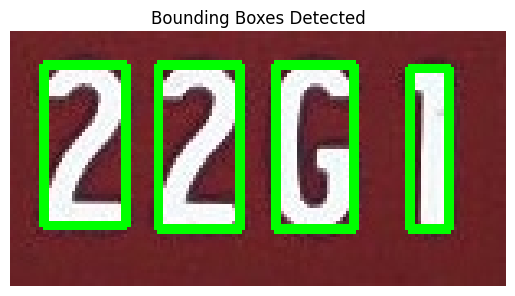

Found 4 bounding boxes in 1-140821001-OCR-AS-B01.jpg_-1.jpg.
Skipped.
Mean value of the binary image: 61.16302762525738


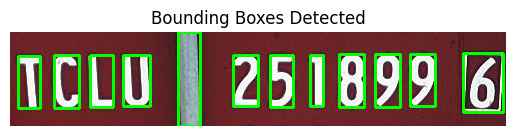

Too many bounding boxes (12) found in 1-140821001-OCR-AS-B01.jpg_0.jpg. Skipping.
Mean value of the binary image: 58.53941846522782


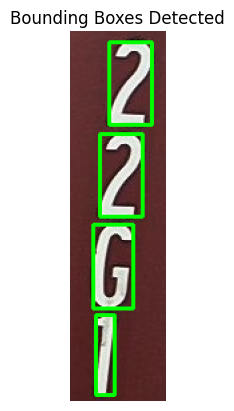

Found 4 bounding boxes in 1-140821001-OCR-LF-C01.jpg_-1.jpg.
Saved: cropped_yolo_dataset\1-140821001-OCR-LF-C01.jpg_-1.jpg and cropped_yolo_dataset\1-140821001-OCR-LF-C01.jpg_-1.txt
Mean value of the binary image: 51.31841633019291


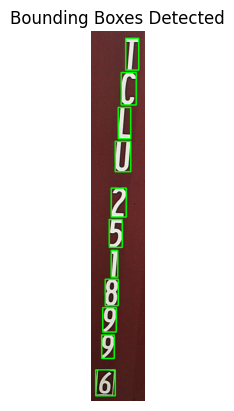

Found 11 bounding boxes in 1-140821001-OCR-LF-C01.jpg_0.jpg.


KeyboardInterrupt: Interrupted by user

In [36]:
import os
import cv2
import matplotlib.pyplot as plt

def save_yolo_labels(image_path, boundRect, save_dir):
    """
    Save YOLO-format labels for the bounding boxes.
    """
    img = cv2.imread(image_path)
    h, w = img.shape[:2]
    label_lines = []
    for rect in boundRect:
        x, y, bw, bh = rect
        # YOLO format: class x_center y_center width height (all normalized)
        x_center = (x + bw / 2) / w
        y_center = (y + bh / 2) / h
        width = bw / w
        height = bh / h
        class_id = 0  # You can change this if you want to assign different classes
        label_lines.append(f"{class_id} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}")
    # Save label file
    base = os.path.splitext(os.path.basename(image_path))[0]
    label_path = os.path.join(save_dir, base + ".txt")
    with open(label_path, "w") as f:
        f.write("\n".join(label_lines))
    # Save image
    img_save_path = os.path.join(save_dir, os.path.basename(image_path))
    cv2.imwrite(img_save_path, img)
    print(f"Saved: {img_save_path} and {label_path}")

def semi_supervised_labeling(image_dir, save_dir, min_area=250):
    """
    For each image, show bounding boxes and ask user to accept or skip.
    If accepted, save YOLO label and image.
    """
    os.makedirs(save_dir, exist_ok=True)
    images = [f for f in os.listdir(image_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    for image_name in images:
        image_path = os.path.join(image_dir, image_name)
        closingImage, boundRect = adaptive_threshold_and_filter(image_path, min_area=min_area)
        if not boundRect:
            print(f"No bounding boxes found for {image_name}. Skipping.")
            continue
        # Condition on number of bounding boxes
        if len(boundRect) != 4 and len(boundRect) != 11:
            print(f"Too many bounding boxes ({len(boundRect)}) found in {image_name}. Skipping.")
            continue
        # Print the number of bounding boxes found
        print(f"Found {len(boundRect)} bounding boxes in {image_name}.")
        # Show the bounding boxes (already done in adaptive_threshold_and_filter)
        resp = input(f"Accept bounding boxes for {image_name}? (y/n): ").strip().lower()
        if resp == "y":
            save_yolo_labels(image_path, boundRect, save_dir)
        else:
            print("Skipped.")

# Example usage:
semi_supervised_labeling("cropped_images", "cropped_yolo_dataset")

[2025-07-14 11:25:39,482] [ WARNING] easyocr.py:71 - Using CPU. Note: This module is much faster with a GPU.
C:\Users\perso\AppData\Local\Temp\ipykernel_17188\4198856166.py:14: DeprecationWarning: The parameter `use_angle_cls` has been deprecated and will be removed in the future. Please use `use_textline_orientation` instead.
  paddle_ocr = PaddleOCR(use_angle_cls=True, lang='en')
Creating model: ('PP-LCNet_x1_0_doc_ori', None)
Using official model (PP-LCNet_x1_0_doc_ori), the model files will be automatically downloaded and saved in C:\Users\perso\.paddlex\official_models.


Fetching 6 files:   0%|          | 0/6 [00:00<?, ?it/s]

Creating model: ('UVDoc', None)
The model(UVDoc) is not supported to run in MKLDNN mode! Using `paddle` instead!
Using official model (UVDoc), the model files will be automatically downloaded and saved in C:\Users\perso\.paddlex\official_models.


Fetching 6 files:   0%|          | 0/6 [00:00<?, ?it/s]

Creating model: ('PP-LCNet_x1_0_textline_ori', None)
Using official model (PP-LCNet_x1_0_textline_ori), the model files will be automatically downloaded and saved in C:\Users\perso\.paddlex\official_models.


Fetching 6 files:   0%|          | 0/6 [00:00<?, ?it/s]

Creating model: ('PP-OCRv5_server_det', None)
Using official model (PP-OCRv5_server_det), the model files will be automatically downloaded and saved in C:\Users\perso\.paddlex\official_models.


Fetching 6 files:   0%|          | 0/6 [00:00<?, ?it/s]

Creating model: ('PP-OCRv5_server_rec', None)
Using official model (PP-OCRv5_server_rec), the model files will be automatically downloaded and saved in C:\Users\perso\.paddlex\official_models.


Fetching 6 files:   0%|          | 0/6 [00:00<?, ?it/s]

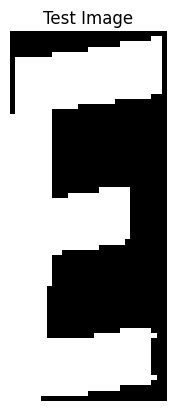

Tesseract: 5
EasyOCR: E


C:\Users\perso\AppData\Local\Temp\ipykernel_17188\4198856166.py:26: DeprecationWarning: Please use `predict` instead.
  result = paddle_ocr.ocr(img)


IndexError: tuple index out of range

In [11]:
import cv2
import pytesseract
import easyocr
from paddleocr import PaddleOCR
from PIL import Image
import matplotlib.pyplot as plt

# If you want to use TrOCR, uncomment and install transformers
# from transformers import TrOCRProcessor, VisionEncoderDecoderModel
# import torch

# --- Load models ---
easyocr_reader = easyocr.Reader(['en'], gpu=False)
paddle_ocr = PaddleOCR(use_angle_cls=True, lang='en')
pytesseract.pytesseract.tesseract_cmd = r'C:\Program Files\Tesseract-OCR\tesseract.exe'

# # TrOCR (optional, needs transformers and model download)
# trocr_processor = TrOCRProcessor.from_pretrained('microsoft/trocr-base-handwritten')
# trocr_model = VisionEncoderDecoderModel.from_pretrained('microsoft/trocr-base-handwritten')

def run_easyocr(img):
    result = easyocr_reader.readtext(img)
    return ' '.join([r[1] for r in result])

def run_paddleocr(img):
    result = paddle_ocr.ocr(img)
    if result and len(result[0]) > 0:
        return ' '.join([line[1][0] for line in result[0]])
    return ''

def run_tesseract(img):
    return pytesseract.image_to_string(img, config='--psm 7').strip()

# def run_trocr(img):
#     pil_img = Image.fromarray(img)
#     pixel_values = trocr_processor(images=pil_img, return_tensors="pt").pixel_values
#     generated_ids = trocr_model.generate(pixel_values)
#     generated_text = trocr_processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
#     return generated_text.strip()

# --- Test on a single image ---
image_path = "cropped_characters\char_0_1-122720001-OCR-LB-C02.png"  # <-- Change this to your image path
img = cv2.imread(image_path)
if img is None:
    print("Image not found!")
else:
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    plt.imshow(gray, cmap='gray')
    plt.axis('off')
    plt.title('Test Image')
    plt.show()

    print("Tesseract:", run_tesseract(gray))
    print("EasyOCR:", run_easyocr(gray))
    print("PaddleOCR:", run_paddleocr(gray))
    # print("TrOCR:", run_trocr(gray))  # Uncomment if using TrOCR

In [4]:
import os
import cv2
import pytesseract

pytesseract.pytesseract.tesseract_cmd = r'C:\Program Files\Tesseract-OCR\tesseract.exe'

import matplotlib.pyplot as plt

# EasyOCR
import easyocr
easyocr_reader = easyocr.Reader(['en'], gpu=False)

# TrOCR
#from transformers import TrOCRProcessor, VisionEncoderDecoderModel
import torch
from PIL import Image

#trocr_processor = TrOCRProcessor.from_pretrained('microsoft/trocr-base-handwritten')
#trocr_model = VisionEncoderDecoderModel.from_pretrained('microsoft/trocr-base-handwritten')

# PaddleOCR
from paddleocr import PaddleOCR
paddle_ocr = PaddleOCR(use_angle_cls=True, lang='en')

def run_trocr(img):
    pil_img = Image.fromarray(img)
    #pixel_values = trocr_processor(images=pil_img, return_tensors="pt").pixel_values
    #generated_ids = trocr_model.generate(pixel_values)
    generated_text = " " #trocr_processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return generated_text.strip()

def run_easyocr(img):
    result = easyocr_reader.readtext(img)
    return ' '.join([r[1] for r in result])

def run_paddleocr(img):
    result = paddle_ocr.ocr(img)
    if result and len(result[0]) > 0:
        return ' '.join([line[1][0] for line in result[0]])
    return ''

def compare_ocr_on_reconstituted_images(labeled_samples_dir="labeled_samples"):
    """
    Compare pytesseract, EasyOCR, TrOCR, and PaddleOCR on reconstituted images.
    """
    for img_id in os.listdir(labeled_samples_dir):
        id_folder = os.path.join(labeled_samples_dir, img_id)
        if not os.path.isdir(id_folder):
            continue
        for labeled_image_subfolder in os.listdir(id_folder):
            subfolder_path = os.path.join(id_folder, labeled_image_subfolder)
            if not os.path.isdir(subfolder_path):
                continue
            for file in os.listdir(subfolder_path):
                if file.endswith('.jpg') and '_reconst_' in file:
                    img_path = os.path.join(subfolder_path, file)
                    img = cv2.imread(img_path)
                    if img is None:
                        print(f"Warning: Could not read image {img_path}")
                        continue
                    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
                    # Tesseract
                    tess_text = pytesseract.image_to_string(gray, config='--psm 7').strip()
                    # EasyOCR
                    easy_text = run_easyocr(gray)
                    # TrOCR
                    #trocr_text = run_trocr(gray)
                    # PaddleOCR
                    paddle_text = run_paddleocr(gray)
                    # Show image and results
                    plt.imshow(gray, cmap='gray')
                    plt.axis('off')
                    plt.title(file)
                    plt.show()
                    print(f"File: {img_path}")
                    print(f"  Tesseract:  {tess_text}")
                    print(f"  EasyOCR:    {easy_text}")
                    #print(f"  TrOCR:      {trocr_text}")
                    print(f"  PaddleOCR:  {paddle_text}")
                    print("-" * 60)

# Example usage:
compare_ocr_on_reconstituted_images("labeled_samples")

[2025-07-09 15:03:29,478] [ WARNING] easyocr.py:71 - Using CPU. Note: This module is much faster with a GPU.
C:\Users\perso\AppData\Local\Temp\ipykernel_32240\3175357772.py:23: DeprecationWarning: The parameter `use_angle_cls` has been deprecated and will be removed in the future. Please use `use_textline_orientation` instead.
  paddle_ocr = PaddleOCR(use_angle_cls=True, lang='en')
Creating model: ('PP-LCNet_x1_0_doc_ori', None)
Using official model (PP-LCNet_x1_0_doc_ori), the model files will be automatically downloaded and saved in C:\Users\perso\.paddlex\official_models.


Fetching 6 files:   0%|          | 0/6 [00:00<?, ?it/s]

Creating model: ('UVDoc', None)
The model(UVDoc) is not supported to run in MKLDNN mode! Using `paddle` instead!
Using official model (UVDoc), the model files will be automatically downloaded and saved in C:\Users\perso\.paddlex\official_models.


Fetching 6 files:   0%|          | 0/6 [00:00<?, ?it/s]

Creating model: ('PP-LCNet_x1_0_textline_ori', None)
Using official model (PP-LCNet_x1_0_textline_ori), the model files will be automatically downloaded and saved in C:\Users\perso\.paddlex\official_models.


Fetching 8 files:   0%|          | 0/8 [00:00<?, ?it/s]

Creating model: ('PP-OCRv5_server_det', None)
Using official model (PP-OCRv5_server_det), the model files will be automatically downloaded and saved in C:\Users\perso\.paddlex\official_models.


Fetching 6 files:   0%|          | 0/6 [00:00<?, ?it/s]

Creating model: ('PP-OCRv5_server_rec', None)
Using official model (PP-OCRv5_server_rec), the model files will be automatically downloaded and saved in C:\Users\perso\.paddlex\official_models.


Fetching 6 files:   0%|          | 0/6 [00:00<?, ?it/s]

C:\Users\perso\AppData\Local\Temp\ipykernel_32240\3175357772.py:37: DeprecationWarning: Please use `predict` instead.
  result = paddle_ocr.ocr(img)


IndexError: tuple index out of range

# Preparation of seal label of the sample_dataset

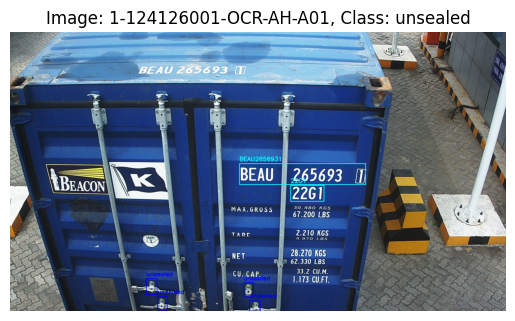

Saved: labeled_samples\124126001\1-124126001-OCR-AH-A01_seal.txt


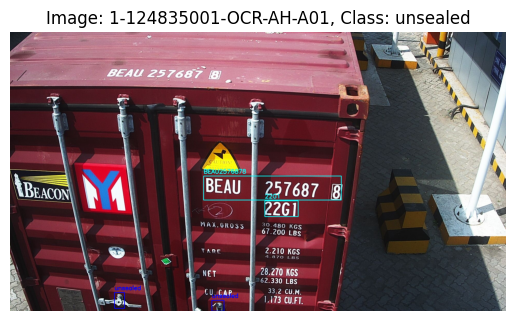

Saved: labeled_samples\124835001\1-124835001-OCR-AH-A01_seal.txt


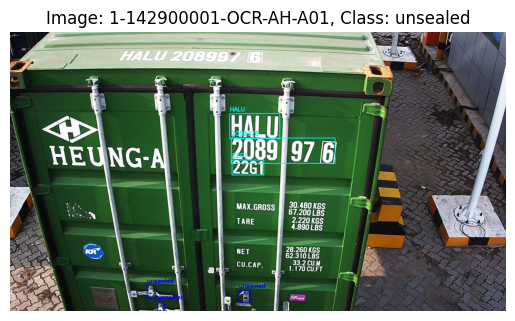

Saved: labeled_samples\142900001\1-142900001-OCR-AH-A01_seal.txt


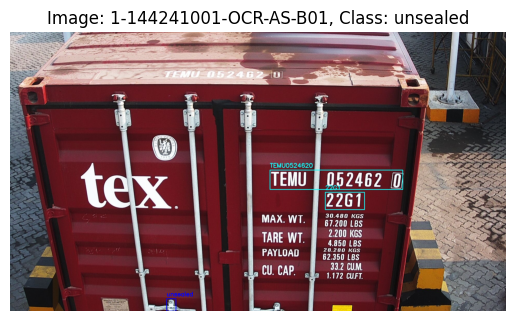

Saved: labeled_samples\144241001\1-144241001-OCR-AS-B01_seal.txt


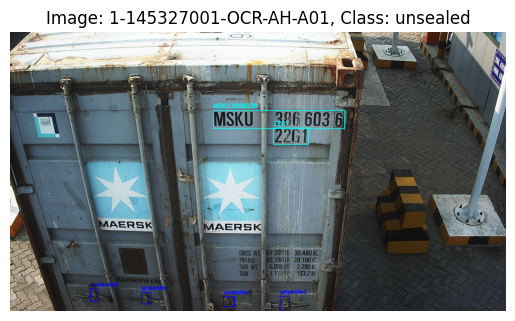

Saved: labeled_samples\145327001\1-145327001-OCR-AH-A01_seal.txt
Saved: yolo_label_sealed\1-150224001-OCR-AH-A01_seal_1.jpg
Saved: yolo_label_sealed\1-150224001-OCR-AH-A01_seal_2.jpg


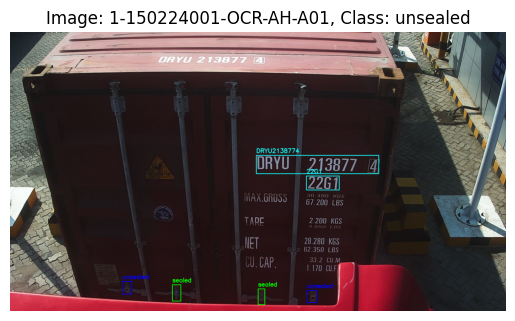

Saved: labeled_samples\150224001\1-150224001-OCR-AH-A01_seal.txt


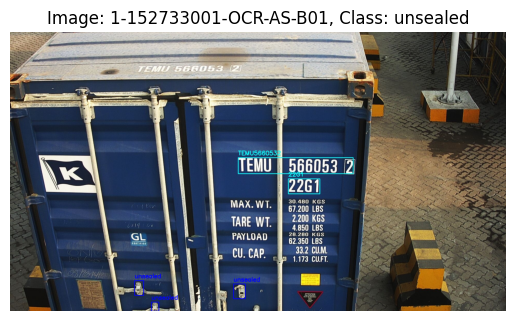

Saved: labeled_samples\152733001\1-152733001-OCR-AS-B01_seal.txt


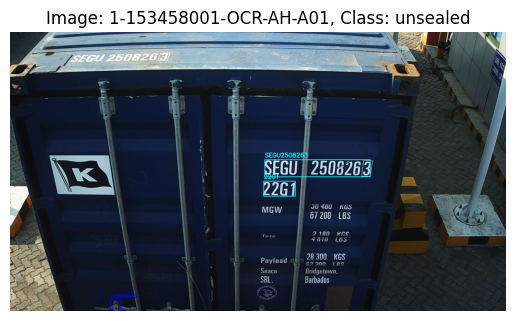

Saved: labeled_samples\153458001\1-153458001-OCR-AH-A01_seal.txt


In [ ]:
import os
import cv2
import matplotlib.pyplot as plt

def extract_and_save_seal_bboxe_image(labeled_samples_dir="labeled_samples", label_text_file ="../yolo_label_sealed"  ,seal_output_dir="yolo_label_sealed"):
    """
    For each labeled image in labeled_samples, extract bounding boxes with class 'sealed' (or your seal class id)
    and save the cropped seal image and its YOLO label in a new folder.
    """
    # Set your seal class id (e.g., 1 if 'sealed' is class 1 in your data.yaml)
    SEAL_CLASS_ID = 1

    # os.makedirs(seal_output_dir, exist_ok=True)

    for img_id in os.listdir(labeled_samples_dir):
        id_folder = os.path.join(labeled_samples_dir, img_id)
        if not os.path.isdir(id_folder):
            continue
        for image in os.listdir(id_folder):
            if not image.lower().endswith(('.jpg', '.jpeg', '.png')):
                continue
            image_no_ext = os.path.splitext(image)[0]
            label_path = os.path.join(label_text_file, image_no_ext + '.txt')
            image_path = os.path.join(id_folder, image)
            if not os.path.exists(label_path):
                continue
            img = cv2.imread(image_path)
            if img is None:
                print(f"Warning: Could not read image {image_path}")
                continue
            h, w = img.shape[:2]
            with open(label_path, 'r') as f:
                lines = f.readlines()
                yolo_label = ""
                for idx, line in enumerate(lines):
                    parts = line.strip().split()
                    if len(parts) < 5:
                        continue
                    class_id = int(parts[0])
                    if class_id == 0:
                        class_name = 'unsealed'
                    elif class_id == SEAL_CLASS_ID:
                        class_name = 'sealed'
                    # Get bounding box coordinates of yolo format
                    x_min = int(float(parts[1]) * w - float(parts[3]) * w / 2)
                    y_min = int(float(parts[2]) * h - float(parts[4]) * h / 2)
                    x_max = int(float(parts[1]) * w + float(parts[3]) * w / 2)
                    y_max = int(float(parts[2]) * h + float(parts[4]) * h / 2)
                    
                    # Crop and save seal image
                    if class_id == SEAL_CLASS_ID:
                        os.makedirs(seal_output_dir, exist_ok=True)
                        cropped_img = img[y_min:y_max, x_min:x_max]
                        crop_name = f"{image_no_ext}_seal_{idx}.jpg"
                        crop_path = os.path.join(seal_output_dir, crop_name)
                        # cv2.imwrite(crop_path, cropped_img)
                        print(f"Saved: {crop_path}")
                    
                    # Save YOLO label for this crop
                    x_center = ((x_min + x_max) / 2) / w
                    y_center = ((y_min + y_max) / 2) / h
                    bbox_w = (x_max - x_min) / w
                    bbox_h = (y_max - y_min) / h
                    yolo_label += f"{class_id} {x_center:.6f} {y_center:.6f} {bbox_w:.6f} {bbox_h:.6f}\n"
                    
                    # Draw rectangle on the image with the class id with different color
                    color = (0, 255, 0) if class_id == SEAL_CLASS_ID else (255, 0, 0)
                    cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color, 2)
                    cv2.putText(img, f"{class_name}", (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.75, color, 2)
                
                # Save the labeled image with bounding box
                cv2.imwrite(image_path, img)
                
                # Display the bounding box on the image
                plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
                plt.axis('off')
                plt.title(f"Image: {image_no_ext}, Class: {class_name}")
                plt.show()
                
                # Save the YOLO label file
                label_save_path = os.path.join(id_folder, f"{image_no_ext}_seal.txt")
                with open(label_save_path, "w") as label_file:
                    label_file.write(yolo_label)
                print(f"Saved: {label_save_path}")

# Example usage:
extract_and_save_seal_bboxes_image(labeled_samples_dir="labeled_samples", label_text_file ="../yolo_label_sealed"  ,seal_output_dir="yolo_label_sealed")

# Saving all seal crop image to prepare for model to classify the sealing

In [12]:
import os
import cv2
import matplotlib.pyplot as plt

def extract_and_save_crop_seal(labeled_samples_dir="images", label_text_file ="../yolo_label_sealed"  ,seal_output_dir="yolo_label_sealed"):
    """
    For each labeled image in labeled_samples, extract bounding boxes with class 'sealed' (or your seal class id)
    and save the cropped seal image and its YOLO label in a new folder.
    """
    # Set your seal class id (e.g., 1 if 'sealed' is class 1 in your data.yaml)
    SEAL_CLASS_ID = 1

    # os.makedirs(seal_output_dir, exist_ok=True)

    for text_id in os.listdir(label_text_file):
        image_no_ext = os.path.splitext(text_id)[0]
        label_path = os.path.join(label_text_file, text_id)
        image_path = os.path.join(labeled_samples_dir, image_no_ext + '.jpg')
        if not os.path.exists(image_path):
            continue
        img = cv2.imread(image_path)
        if img is None:
            print(f"Warning: Could not read image {image_path}")
            continue
        h, w = img.shape[:2]
        with open(label_path, 'r') as f:
            lines = f.readlines()
            for idx, line in enumerate(lines):
                parts = line.strip().split()
                if len(parts) < 5:
                    continue
                class_id = int(parts[0])
                if class_id == 0:
                    class_name = 'unsealed'
                elif class_id == SEAL_CLASS_ID:
                    class_name = 'sealed'
                # Get bounding box coordinates of yolo format
                x_min = int(float(parts[1]) * w - float(parts[3]) * w / 2)
                y_min = int(float(parts[2]) * h - float(parts[4]) * h / 2)
                x_max = int(float(parts[1]) * w + float(parts[3]) * w / 2)
                y_max = int(float(parts[2]) * h + float(parts[4]) * h / 2)
                
                # Crop and save seal image
                os.makedirs(seal_output_dir, exist_ok=True)
                cropped_img = img[y_min:y_max, x_min:x_max]
                crop_name = f"{image_no_ext}_{class_name}_{idx}.jpg"
                crop_path = os.path.join(seal_output_dir, crop_name)
                cv2.imwrite(crop_path, cropped_img)
                print(f"Saved: {crop_path}")
                
               
# Example usage:
extract_and_save_crop_seal(labeled_samples_dir="images", label_text_file ="../yolo_label_sealed"  ,seal_output_dir="seal_cropped_images")

Saved: seal_cropped_images\1-122720001-OCR-AS-B01_unsealed_0.jpg
Saved: seal_cropped_images\1-122720001-OCR-AS-B01_unsealed_1.jpg
Saved: seal_cropped_images\1-122830001-OCR-AS-B01_unsealed_0.jpg
Saved: seal_cropped_images\1-122830001-OCR-AS-B01_unsealed_1.jpg
Saved: seal_cropped_images\1-122830001-OCR-AS-B01_unsealed_2.jpg
Saved: seal_cropped_images\1-122830001-OCR-AS-B01_sealed_3.jpg
Saved: seal_cropped_images\1-122843001-OCR-AS-B01_unsealed_0.jpg
Saved: seal_cropped_images\1-122843001-OCR-AS-B01_unsealed_1.jpg
Saved: seal_cropped_images\1-122843001-OCR-AS-B01_unsealed_2.jpg
Saved: seal_cropped_images\1-122856001-OCR-AH-A01_unsealed_0.jpg
Saved: seal_cropped_images\1-122856001-OCR-AH-A01_unsealed_1.jpg
Saved: seal_cropped_images\1-122856001-OCR-AH-A01_sealed_2.jpg
Saved: seal_cropped_images\1-122856001-OCR-AH-A01_unsealed_3.jpg
Saved: seal_cropped_images\1-122930001-OCR-AS-B01_unsealed_0.jpg
Saved: seal_cropped_images\1-122930001-OCR-AS-B01_unsealed_1.jpg
Saved: seal_cropped_images\1-